## Using lifespan models to make predictions on new data

This notebook shows how to apply the coefficients from pre-estimated normative models to new data. This can be done in two different ways: (i) using a new set of data derived from the same sites used to estimate the model and (ii) on a completely different set of sites. In the latter case, we also need to estimate the site effect, which requires some calibration/adaptation data. As an illustrative example, we use a dataset derived from several [OpenNeuro datasets](https://openneuro.org/) and adapt the learned model to make predictions on these data. 

First, if necessary, we install PCNtoolkit (note: this tutorial requires at least version 0.27)

In [1]:
! pip install pcntoolkit

  Using cached argparse-1.4.0-py2.py3-none-any.whl.metadata (2.8 kB)
Using cached argparse-1.4.0-py2.py3-none-any.whl (23 kB)


In [2]:
! git clone https://github.com/predictive-clinical-neuroscience/braincharts.git

fatal: destination path 'braincharts' already exists and is not an empty directory.


In [2]:
# we need to be in the scripts folder when we import the libraries in the code block below,
# because there is a function called nm_utils that is in the scripts folder that we need to import
import os
wdir =('/Users/valentinahaas/Desktop/ETH/Masterarbeit/PythonProjects/braincharts/scripts/')

os.chdir(wdir) #this path is setup for running on Google Colab. Change it to match your local path if running locally

Now we import the required libraries

In [3]:
import numpy as np
import pandas as pd
import pickle
from matplotlib import pyplot as plt
import seaborn as sns

from pcntoolkit.normative import estimate, predict, evaluate
from pcntoolkit.util.utils import compute_MSLL, create_design_matrix
from nm_utils import remove_bad_subjects, load_2d

We need to unzip the models. 

In [4]:
os.chdir(os.path.join(wdir,'models/'))

In [30]:
# we will use the biggest sample as our training set (approx. N=57000 subjects from 82 sites)
# for more info on the other pretrained models available in this repository, 
# please refer to the accompanying paper https://elifesciences.org/articles/72904
! unzip lifespan_57K_82sites.zip

unzip:  cannot find or open lifespan_57K_82sites.zip, lifespan_57K_82sites.zip.zip or lifespan_57K_82sites.zip.ZIP.


Next, we configure some basic variables, like where we want the analysis to be done and which model we want to use.

**Note:** We maintain a list of site ids for each dataset, which describe the site names in the training and test data (`site_ids_tr` and `site_ids_te`), plus also the adaptation data . The training site ids are provided as a text file in the distribution and the test ids are extracted automatically from the pandas dataframe (see below). If you use additional data from the sites (e.g. later waves from ABCD), it may be necessary to adjust the site names to match the names in the training set. See the accompanying paper for more details

In [5]:
# which model do we wish to use?
model_name = 'lifespan_57K_82sites'
site_names = 'site_ids_ct_82sites.txt'

# where the analysis takes place
root_dir = wdir

# where the data files live
data_dir = os.path.join(wdir,'docs')

# where the models live
out_dir = os.path.join(root_dir, 'models', model_name)

# load a set of site ids from this model. This must match the training data
with open(os.path.join(root_dir,'docs', site_names)) as f:
    site_ids_tr = f.read().splitlines()

### Load test data

**Note:** For the purposes of this tutorial, we make predictions for a multi-site transfer dataset, derived from [OpenNeuro](https://openneuro.org/).

In [6]:
df_te = pd.read_csv('/Volumes/INANL/56_Valentina_Haas/brain_age_centilbrain/07_BrainCharts/Adaptation/Braincharts_SCI_Template.csv')

# extract a list of unique site ids from the test set
site_ids_te =  sorted(set(df_te['site'].to_list()))


###  Load adaptation data


If the data you wish to make predictions for is not derived from the same scanning sites as those in the trainig set, it is necessary to learn the site effect so that we can account for it in the predictions. In order to do this in an unbiased way, we use a separate dataset, which we refer to as 'adaptation' data. This must contain data for all the same sites as in the test dataset and we assume these are coded in the same way, based on a the 'sitenum' column in the dataframe. 

In [7]:
#adaptation_data = os.path.join(data_dir, 'OpenNeuroTransfer_ct_ad.csv')
adaptation_data = os.path.join(data_dir, 'Adaption_file_Controls1.csv')
#adaptation_data = "/Volumes/team-1/INANL/56_Valentina_Haas/brain_age_centilbrain/07_BrainCharts/Adaptation/Adaption_file_Controls1.csv"
df_ad = pd.read_csv(adaptation_data)

# extract a list of unique site ids from the test set
#site_ids_ad =  sorted(set(df_ad['site'].to_list()))
site_ids_ad = sorted(set(df_ad['site'].dropna().astype(str).tolist()))
print(df_ad.head())
if not all(elem in site_ids_ad for elem in site_ids_te):
    print('Warning: some of the testing sites are not in the adaptation data')

   subjects   age  sex    site  sitenum  lh_G&S_frontomargin_thickness  \
0       3.0  34.9  1.0  XXX_01      7.0                          2.113   
1       4.0  39.8  1.0  XXX_01      1.0                          2.050   
2       7.0  35.9  0.0  XXX_01      1.0                          2.177   
3       8.0  40.9  1.0  XXX_01      1.0                          1.936   
4       9.0  35.1  1.0  XXX_01      1.0                          2.271   

   lh_G&S_occipital_inf_thickness  lh_G&S_paracentral_thickness  \
0                           2.780                         2.272   
1                           2.394                         2.148   
2                           2.278                         2.179   
3                           2.508                         2.156   
4                           2.269                         2.362   

   lh_G&S_subcentral_thickness  lh_G&S_transv_frontopol_thickness  ...  \
0                        2.603                              2.396  ...   
1   

In [8]:
# Check for NaN values in the test data
print("Checking for NaN values in test data:")
print(df_te.isnull().sum())  # Check for NaNs in test data

# Check for NaN values in the adaptation data
print("Checking for NaN values in adaptation data:")
print(df_ad.isnull().sum())  # Check for NaNs in adaptation data

Checking for NaN values in test data:
subjects                         0
age                              0
sex                              0
site                             0
sitenum                          0
                                ..
EstimatedTotalIntraCranialVol    0
Left-Thalamus-Proper             0
Right-Thalamus-Proper            0
BrainSegVolNotVentSurf           0
SupraTentorialVolNotVentVox      0
Length: 250, dtype: int64
Checking for NaN values in adaptation data:
subjects                         0
age                              0
sex                              0
site                             0
sitenum                          0
                                ..
EstimatedTotalIntraCranialVol    0
Left-Thalamus-Proper             0
Right-Thalamus-Proper            0
BrainSegVolNotVentSurf           0
SupraTentorialVolNotVentVox      0
Length: 250, dtype: int64


### Configure which models to fit

Now, we configure which imaging derived phenotypes (IDPs) we would like to process. This is just a list of column names in the dataframe we have loaded above. 

We could load the whole set (i.e. all phenotypes for which we have models for ... 

In [9]:
# load the list of idps for left and right hemispheres, plus subcortical regions
with open(os.path.join(data_dir, 'phenotypes_ct_lh.txt')) as f:
    idp_ids_lh = f.read().splitlines()
with open(os.path.join(data_dir, 'phenotypes_ct_rh.txt')) as f:
    idp_ids_rh = f.read().splitlines()
with open(os.path.join(data_dir, 'phenotypes_sc.txt')) as f:
    idp_ids_sc = f.read().splitlines()

# we choose here to process all idps
idp_ids = idp_ids_lh + idp_ids_rh #+ idp_ids_sc

### Configure covariates 

Now, we configure some parameters to fit the model. First, we choose which columns of the pandas dataframe contain the covariates (age and sex). The site parameters are configured automatically later on by the `configure_design_matrix()` function, when we loop through the IDPs in the list

The supplied coefficients are derived from a 'warped' Bayesian linear regression model, which uses a nonlinear warping function to model non-Gaussianity (`sinarcsinh`) plus a non-linear basis expansion (a cubic b-spline basis set with 5 knot points, which is the default value in the PCNtoolkit package). Since we are sticking with the default value, we do not need to specify any parameters for this, but we do need to specify the limits. We choose to pad the input by a few years either side of the input range. We will also set a couple of options that control the estimation of the model

For further details about the likelihood warping approach, see the accompanying paper and [Fraza et al 2021](https://www.biorxiv.org/content/10.1101/2021.04.05.438429v1).

In [10]:
# which data columns do we wish to use as covariates? 
cols_cov = ['age','sex']

# limits for cubic B-spline basis 
xmin = -5 
xmax = 110

# Absolute Z treshold above which a sample is considered to be an outlier (without fitting any model)
outlier_thresh = 7

### Make predictions

This will make predictions for each IDP separately. This is done by extracting a column from the dataframe (i.e. specifying the IDP as the response variable) and saving it as a numpy array. Then, we configure the covariates, which is a numpy data array having the number of rows equal to the number of datapoints in the test set. The columns are specified as follows: 

- A global intercept (column of ones)
- The covariate columns (here age and sex, coded as 0=female/1=male)
- Dummy coded columns for the sites in the training set (one column per site)
- Columns for the basis expansion (seven columns for the default parameterisation)

Once these are saved as numpy arrays in ascii format (as here) or (alternatively) in pickle format, these are passed as inputs to the `predict()` method in the PCNtoolkit normative modelling framework. These are written in the same format to the location specified by `idp_dir`. At the end of this step, we have a set of predictions and Z-statistics for the test dataset that we can take forward to further analysis.

Note that when we need to make predictions on new data, the procedure is more involved, since we need to prepare, process and store covariates, response variables and site ids for the adaptation data. 

In [11]:
for idp_num, idp in enumerate(idp_ids):
    print('Running IDP', idp_num, idp, ':')
    idp_dir = os.path.join(out_dir, idp)
    os.chdir(idp_dir)

    # extract and save the response variables for the test set
    y_te = df_te[idp].to_numpy()

    # save the variables
    resp_file_te = os.path.join(idp_dir, 'resp_te.txt')
    np.savetxt(resp_file_te, y_te)

    # configure and save the design matrix
    cov_file_te = os.path.join(idp_dir, 'cov_bspline_te.txt')
    X_te = create_design_matrix(df_te[cols_cov],
                                site_ids = df_te['site'],
                                all_sites = site_ids_tr,
                                basis = 'bspline',
                                xmin = xmin,
                                xmax = xmax)
    np.savetxt(cov_file_te, X_te)

    # check whether all sites in the test set are represented in the training set
    if all(elem in site_ids_tr for elem in site_ids_te):
        print('All sites are present in the training data')

        # just make predictions
        yhat_te, s2_te, Z = predict(cov_file_te,
                                    alg='blr',
                                    respfile=resp_file_te,
                                    model_path=os.path.join(idp_dir,'Models'))
    else:
        print('Some sites missing from the training data. Adapting model')

        # save the covariates for the adaptation data
        X_ad = create_design_matrix(df_ad[cols_cov],
                                    site_ids = df_ad['site'],
                                    all_sites = site_ids_tr,
                                    basis = 'bspline',
                                    xmin = xmin,
                                    xmax = xmax)
        cov_file_ad = os.path.join(idp_dir, 'cov_bspline_ad.txt')
        np.savetxt(cov_file_ad, X_ad)

        # save the responses for the adaptation data
        resp_file_ad = os.path.join(idp_dir, 'resp_ad.txt')
        y_ad = df_ad[idp].to_numpy()
        np.savetxt(resp_file_ad, y_ad)

        # save the site ids for the adaptation data
        sitenum_file_ad = os.path.join(idp_dir, 'sitenum_ad.txt')
        site_num_ad = df_ad['sitenum'].to_numpy(dtype=int)
        np.savetxt(sitenum_file_ad, site_num_ad)

        # save the site ids for the test data
        sitenum_file_te = os.path.join(idp_dir, 'sitenum_te.txt')
        site_num_te = df_te['sitenum'].to_numpy(dtype=int)
        np.savetxt(sitenum_file_te, site_num_te)

        yhat_te, s2_te, Z = predict(cov_file_te,
                                    alg = 'blr',
                                    respfile = resp_file_te,
                                    model_path = os.path.join(idp_dir,'Models'),
                                    adaptrespfile = resp_file_ad,
                                    adaptcovfile = cov_file_ad,
                                    adaptvargroupfile = sitenum_file_ad,
                                    testvargroupfile = sitenum_file_te)


Running IDP 0 lh_G&S_frontomargin_thickness :
Some sites missing from the training data. Adapting model
Loading data ...
Prediction by model  1 of 1
Evaluating the model ...
Evaluations Writing outputs ...
Writing outputs ...
Running IDP 1 lh_G&S_occipital_inf_thickness :
Some sites missing from the training data. Adapting model
Loading data ...
Prediction by model  1 of 1
Evaluating the model ...
Evaluations Writing outputs ...
Writing outputs ...
Running IDP 2 lh_G&S_paracentral_thickness :
Some sites missing from the training data. Adapting model
Loading data ...
Prediction by model  1 of 1
Evaluating the model ...
Evaluations Writing outputs ...
Writing outputs ...
Running IDP 3 lh_G&S_subcentral_thickness :
Some sites missing from the training data. Adapting model
Loading data ...
Prediction by model  1 of 1
Evaluating the model ...
Evaluations Writing outputs ...
Writing outputs ...
Running IDP 4 lh_G&S_transv_frontopol_thickness :
Some sites missing from the training data. Adapt

### Preparing dummy data for plotting

Now, we plot the centiles of variation estimated by the normative model. 

We do this by making use of a set of dummy covariates that span the whole range of the input space (for age) for a fixed value of the other covariates (e.g. sex) so that we can make predictions for these dummy data points, then plot them. We configure these dummy predictions using the same procedure as we used for the real data. We can use the same dummy data for all the IDPs we wish to plot

In [12]:
# which sex do we want to plot? 
sex = 1 # 1 = male 0 = female
if sex == 1:
    clr = 'blue';
else:
    clr = 'red'

# create dummy data for visualisation
print('configuring dummy data ...')
xx = np.arange(xmin, xmax, 0.5)
X0_dummy = np.zeros((len(xx), 2))
X0_dummy[:,0] = xx
X0_dummy[:,1] = sex

# create the design matrix
X_dummy = create_design_matrix(X0_dummy, xmin=xmin, xmax=xmax, site_ids=None, all_sites=site_ids_tr)

# save the dummy covariates
cov_file_dummy = os.path.join(out_dir,'cov_bspline_dummy_mean.txt')
np.savetxt(cov_file_dummy, X_dummy)

configuring dummy data ...


### Plotting the normative models

Now we loop through the IDPs, plotting each one separately. The outputs of this step are a set of quantitative regression metrics for each IDP and a set of centile curves which we plot the test data against. 

This part of the code is relatively complex because we need to keep track of many quantities for the plotting. We also need to remember whether the data need to be warped or not. By default in PCNtoolkit, predictions in the form of `yhat, s2` are always in the warped (Gaussian) space. If we want predictions in the input (non-Gaussian) space, then we need to warp them with the inverse of the estimated warping function. This can be done using the function `nm..warp.warp_predictions()`.

**Note:** it is necessary to update the intercept for each of the sites. For purposes of visualisation, here we do this by adjusting the median of the data to match the dummy predictions, but note that all the quantitative metrics are estimated using the predictions that are adjusted properly using a learned offset (or adjusted using a hold-out adaptation set, as above). Note also that for the calibration data we require at least two data points of the same sex in each site to be able to estimate the variance. Of course, in a real example, you would want many more than just two since we need to get a reliable estimate of the variance for each site. 

Running IDP 0 lh_G&S_frontomargin_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.13290195]), 'Rho': array([0.1749749]), 'pRho': array([0.32494441]), 'SMSE': array([1.03994471]), 'EXPV': array([0.02983141])}


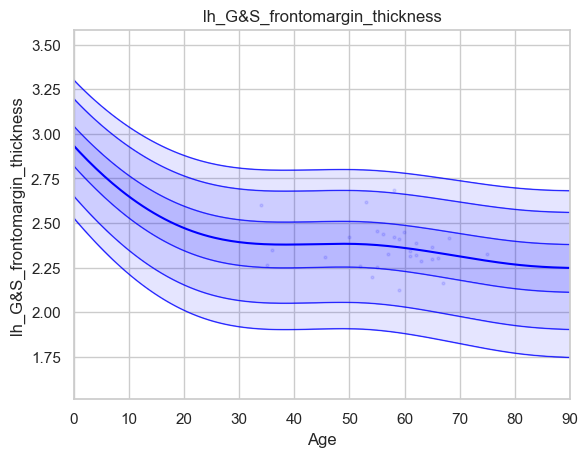

Running IDP 1 lh_G&S_occipital_inf_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.1678226]), 'Rho': array([0.10515874]), 'pRho': array([0.55675265]), 'SMSE': array([1.00586367]), 'EXPV': array([0.01105439])}


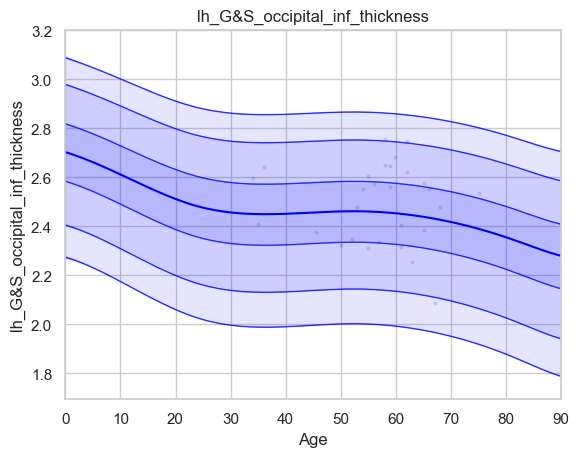

Running IDP 2 lh_G&S_paracentral_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.17870633]), 'Rho': array([0.34246517]), 'pRho': array([0.04691818]), 'SMSE': array([1.32697569]), 'EXPV': array([0.116872])}


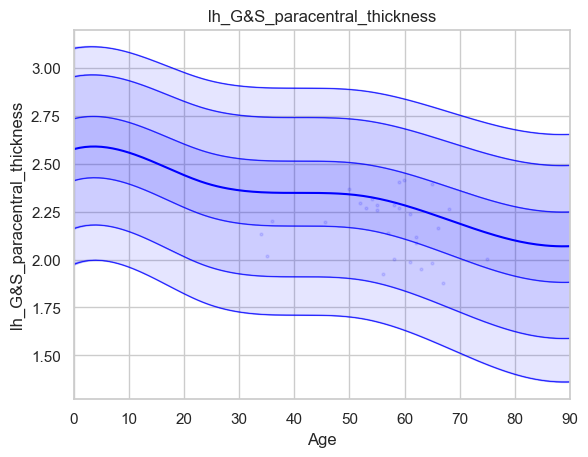

Running IDP 3 lh_G&S_subcentral_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.16654411]), 'Rho': array([0.18403834]), 'pRho': array([0.29997279]), 'SMSE': array([1.35969628]), 'EXPV': array([0.01349965])}


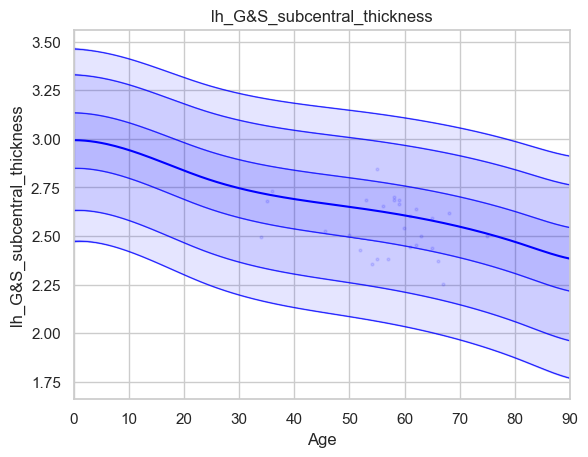

Running IDP 4 lh_G&S_transv_frontopol_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.16904671]), 'Rho': array([0.19384784]), 'pRho': array([0.27433617]), 'SMSE': array([1.21576132]), 'EXPV': array([0.03485136])}


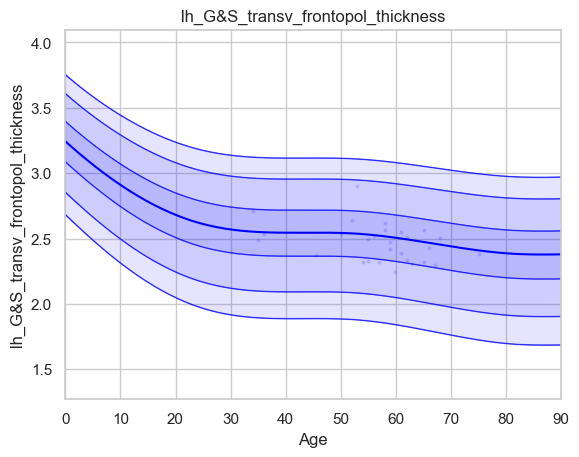

Running IDP 5 lh_G&S_cingul-Ant_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.14826949]), 'Rho': array([-0.12332687]), 'pRho': array([0.49008836]), 'SMSE': array([1.09059606]), 'EXPV': array([-0.0905175])}


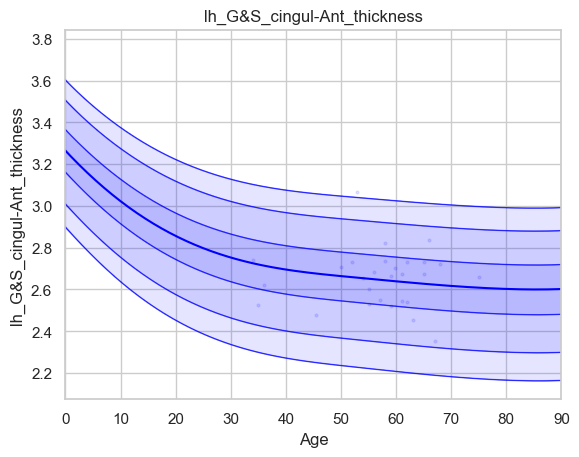

Running IDP 6 lh_G&S_cingul-Mid-Ant_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.12146947]), 'Rho': array([0.15905979]), 'pRho': array([0.37175461]), 'SMSE': array([1.08696618]), 'EXPV': array([-0.06869352])}


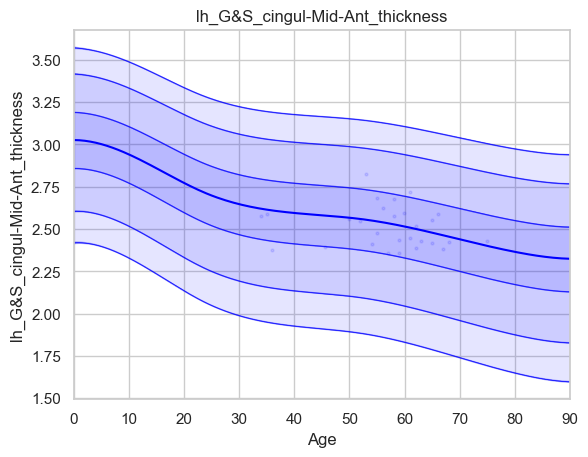

Running IDP 7 lh_G&S_cingul-Mid-Post_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.1202702]), 'Rho': array([0.15382084]), 'pRho': array([0.3879778]), 'SMSE': array([1.02929259]), 'EXPV': array([-0.00558654])}


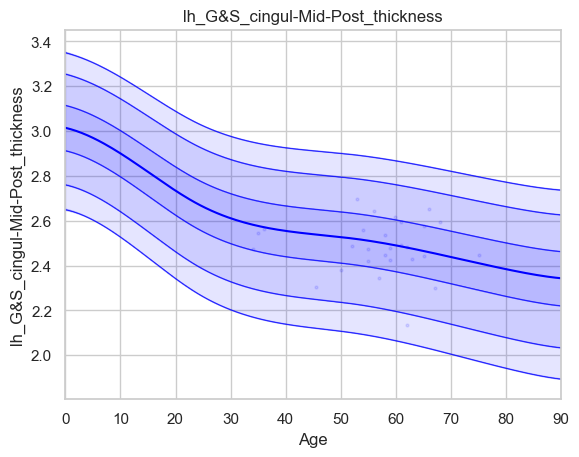

Running IDP 8 lh_G_cingul-Post-dorsal_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.17151328]), 'Rho': array([0.26399899]), 'pRho': array([0.13218648]), 'SMSE': array([0.9322593]), 'EXPV': array([0.06832315])}


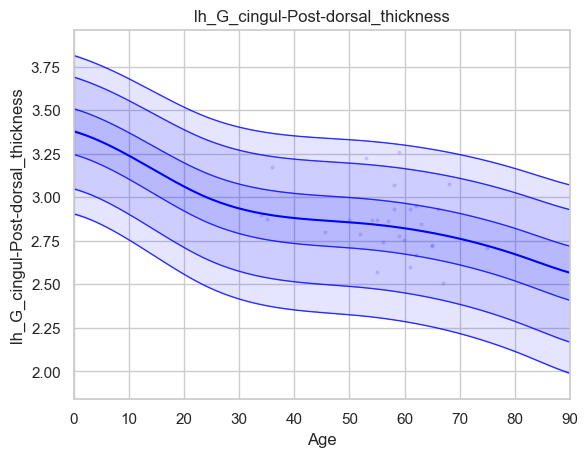

Running IDP 9 lh_G_cingul-Post-ventral_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.19772718]), 'Rho': array([0.52217571]), 'pRho': array([0.00125729]), 'SMSE': array([0.86478225]), 'EXPV': array([0.13536746])}


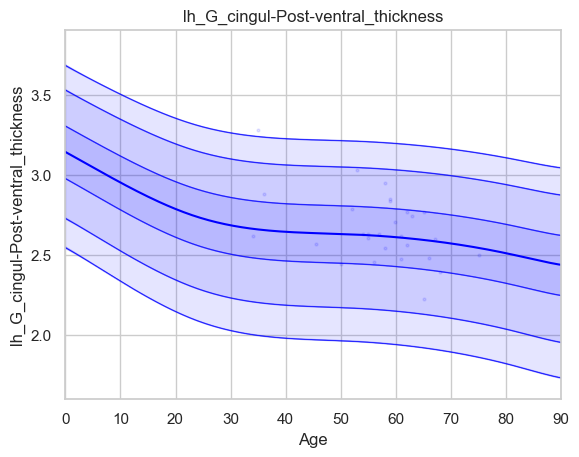

Running IDP 10 lh_G_cuneus_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.13938745]), 'Rho': array([-0.03758938]), 'pRho': array([0.83414576]), 'SMSE': array([1.03255264]), 'EXPV': array([-0.01926427])}


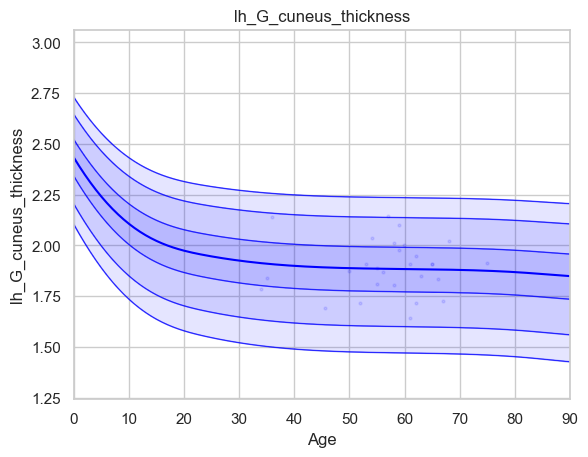

Running IDP 11 lh_G_front_inf-Opercular_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.14517852]), 'Rho': array([0.36463781]), 'pRho': array([0.03332579]), 'SMSE': array([0.95553907]), 'EXPV': array([0.13255952])}


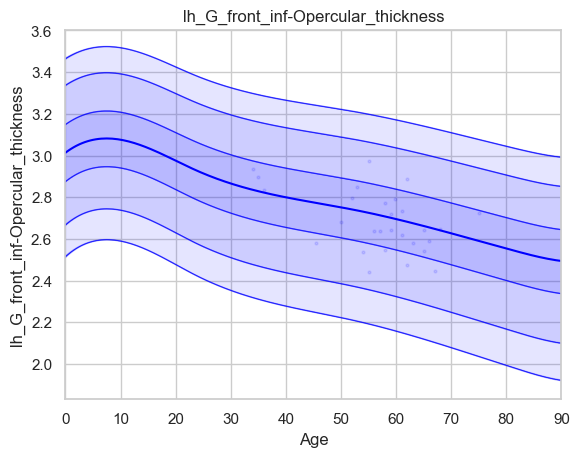

Running IDP 12 lh_G_front_inf-Orbital_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.17868269]), 'Rho': array([0.34101782]), 'pRho': array([0.04793841]), 'SMSE': array([0.92975509]), 'EXPV': array([0.11187362])}


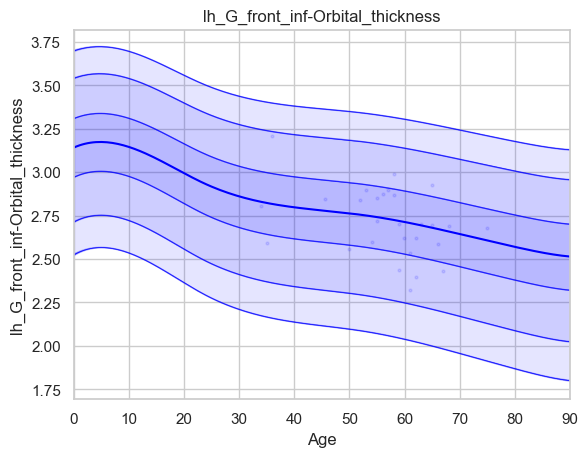

Running IDP 13 lh_G_front_inf-Triangul_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.11678854]), 'Rho': array([0.31633822]), 'pRho': array([0.06817496]), 'SMSE': array([0.95616166]), 'EXPV': array([0.07133583])}


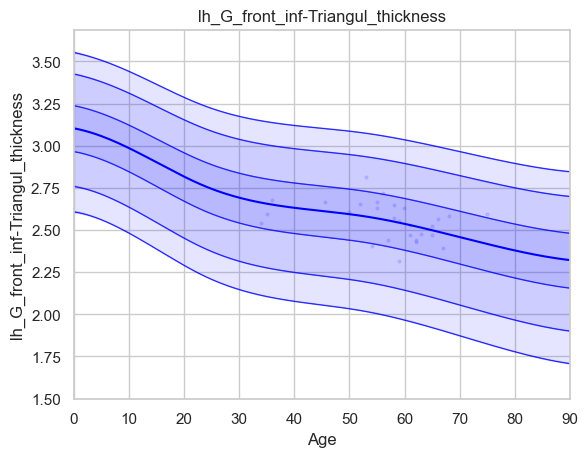

Running IDP 14 lh_G_front_middle_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.13219616]), 'Rho': array([0.23945499]), 'pRho': array([0.17394859]), 'SMSE': array([1.05002227]), 'EXPV': array([-0.00494891])}


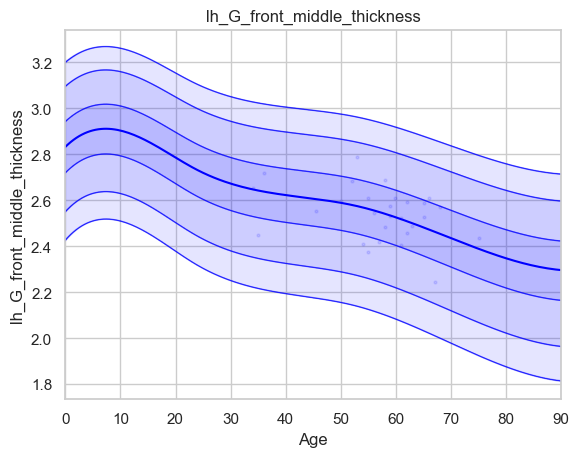

Running IDP 15 lh_G_front_sup_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.12156097]), 'Rho': array([0.37737144]), 'pRho': array([0.0270807]), 'SMSE': array([0.88831153]), 'EXPV': array([0.11896999])}


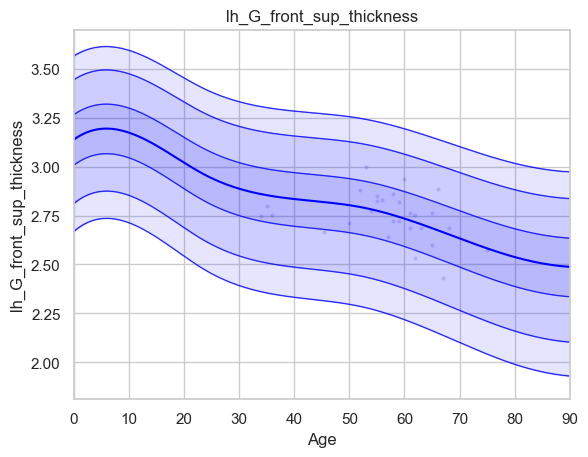

Running IDP 16 lh_G_Ins_lg&S_cent_ins_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.19047088]), 'Rho': array([0.]), 'pRho': array([1.]), 'SMSE': array([0.]), 'EXPV': array([0.])}


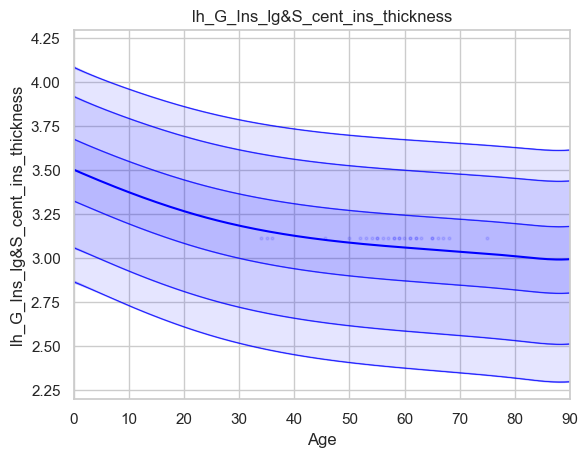

Running IDP 17 lh_G_insular_short_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.17794342]), 'Rho': array([0.44202561]), 'pRho': array([0.00821093]), 'SMSE': array([0.92241831]), 'EXPV': array([0.14967492])}


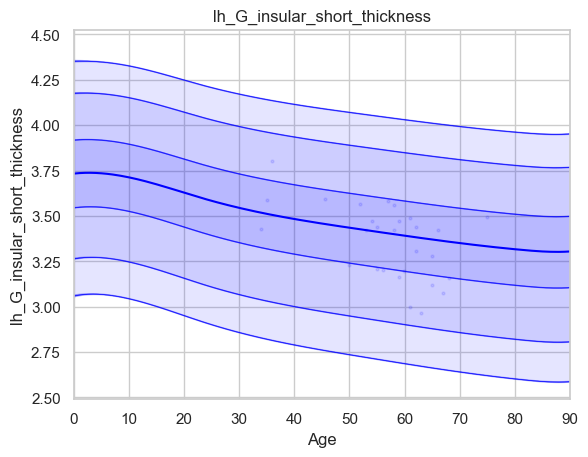

Running IDP 18 lh_G_occipital_middle_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.12581464]), 'Rho': array([0.31256889]), 'pRho': array([0.07177243]), 'SMSE': array([0.90987833]), 'EXPV': array([0.09031238])}


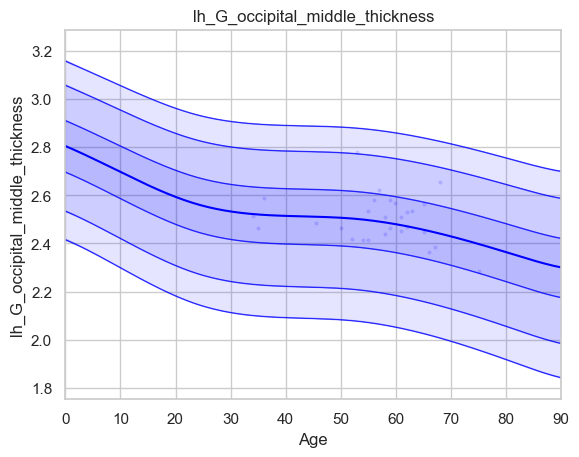

Running IDP 19 lh_G_occipital_sup_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.15486325]), 'Rho': array([-0.00694071]), 'pRho': array([0.96917353]), 'SMSE': array([1.04016962]), 'EXPV': array([-0.0321889])}


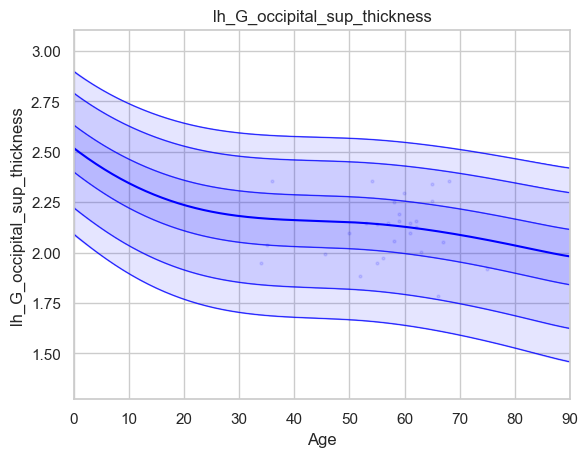

Running IDP 20 lh_G_oc-temp_lat-fusifor_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.18962317]), 'Rho': array([0.36680412]), 'pRho': array([0.03218865]), 'SMSE': array([0.92583401]), 'EXPV': array([0.09635562])}


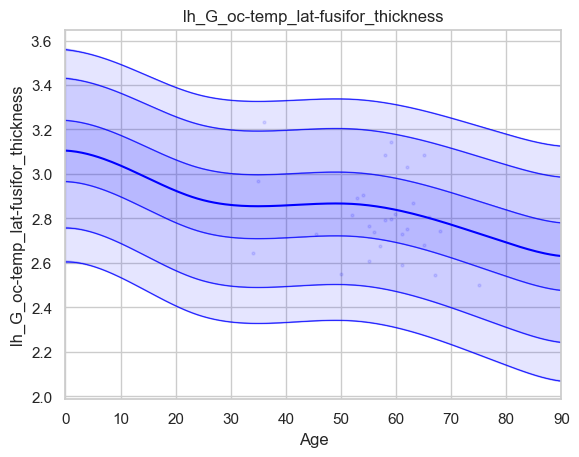

Running IDP 21 lh_G_oc-temp_med-Lingual_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.1281414]), 'Rho': array([-0.13831983]), 'pRho': array([0.43828005]), 'SMSE': array([1.03203176]), 'EXPV': array([-0.02345541])}


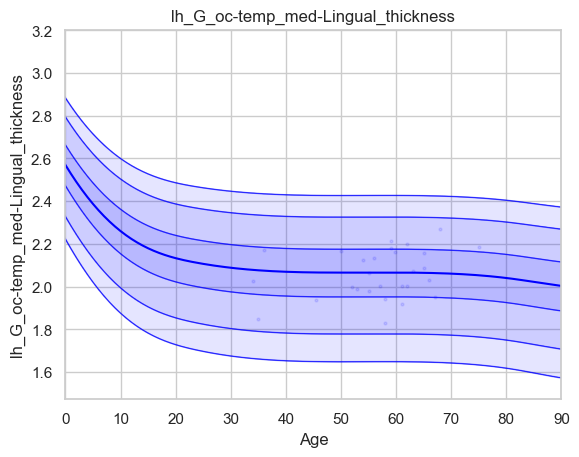

Running IDP 22 lh_G_oc-temp_med-Parahip_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.18877269]), 'Rho': array([0.04901366]), 'pRho': array([0.78476453]), 'SMSE': array([1.09977938]), 'EXPV': array([-0.00569401])}


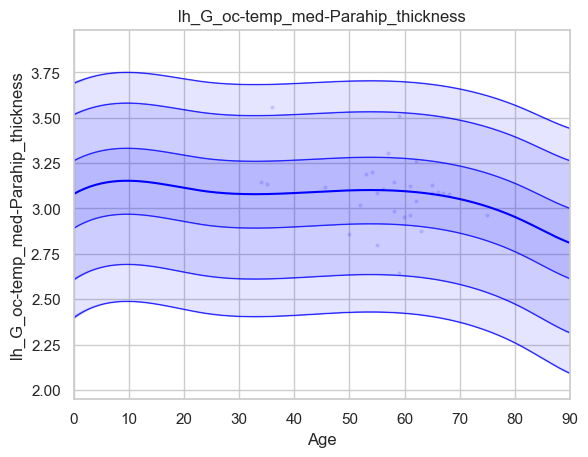

Running IDP 23 lh_G_orbital_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.13389839]), 'Rho': array([0.3031794]), 'pRho': array([0.08136757]), 'SMSE': array([1.0326689]), 'EXPV': array([0.08455026])}


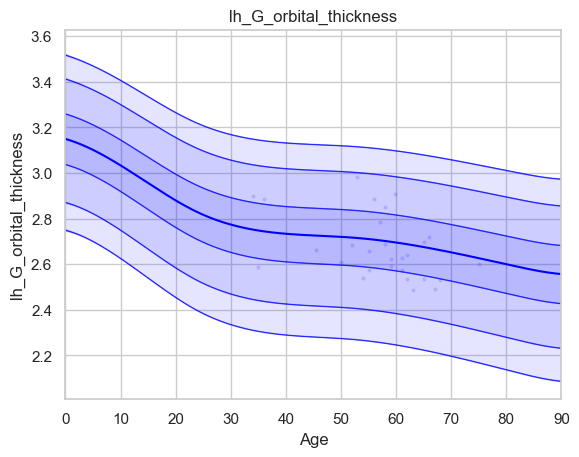

Running IDP 24 lh_G_pariet_inf-Angular_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.12903641]), 'Rho': array([0.29725626]), 'pRho': array([0.08790387]), 'SMSE': array([0.95883787]), 'EXPV': array([0.078042])}


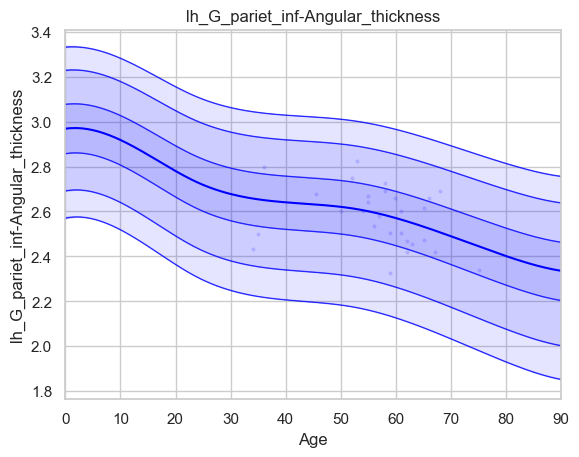

Running IDP 25 lh_G_pariet_inf-Supramar_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.12413504]), 'Rho': array([0.2967414]), 'pRho': array([0.08849024]), 'SMSE': array([0.93225406]), 'EXPV': array([0.07645093])}


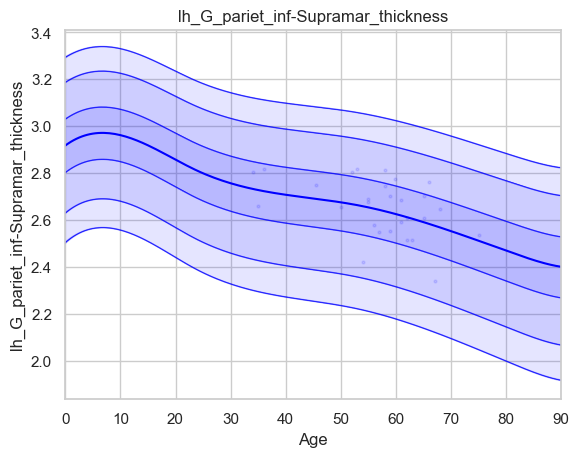

Running IDP 26 lh_G_parietal_sup_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.12994883]), 'Rho': array([0.18394307]), 'pRho': array([0.30022885]), 'SMSE': array([0.98169491]), 'EXPV': array([0.02156169])}


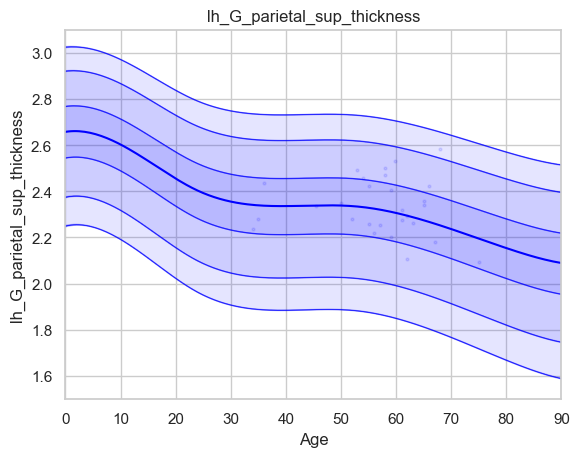

Running IDP 27 lh_G_postcentral_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.10946745]), 'Rho': array([0.36591381]), 'pRho': array([0.03265215]), 'SMSE': array([0.90295593]), 'EXPV': array([0.13355515])}


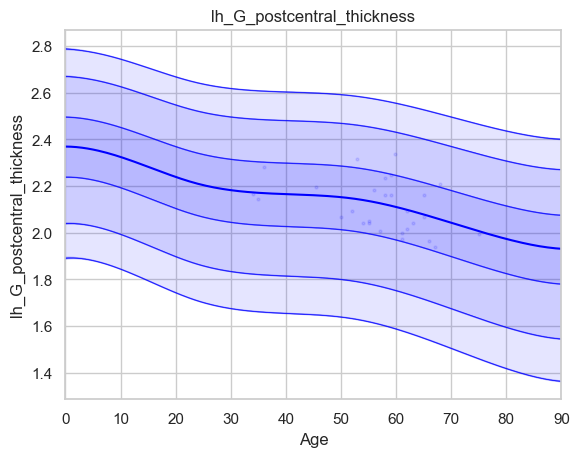

Running IDP 28 lh_G_precentral_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.13888639]), 'Rho': array([0.52584631]), 'pRho': array([0.00113902]), 'SMSE': array([0.73268718]), 'EXPV': array([0.27419635])}


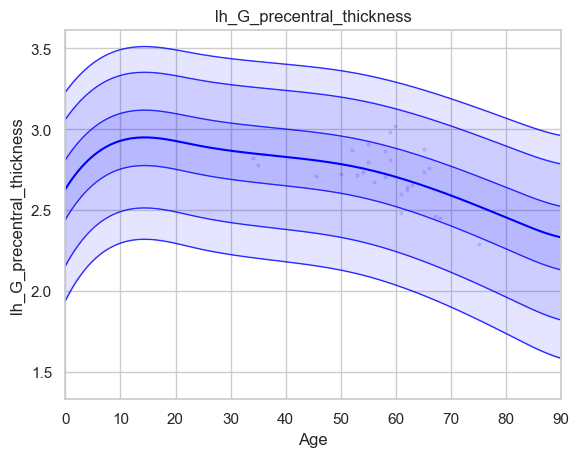

Running IDP 29 lh_G_precuneus_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.13941608]), 'Rho': array([0.26173915]), 'pRho': array([0.13569412]), 'SMSE': array([1.0316081]), 'EXPV': array([0.0654283])}


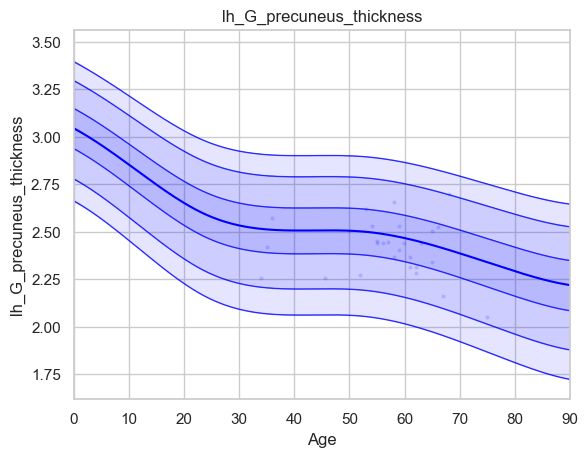

Running IDP 30 lh_G_rectus_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.14971556]), 'Rho': array([-0.1117239]), 'pRho': array([0.53219416]), 'SMSE': array([1.0772102]), 'EXPV': array([-0.06823624])}


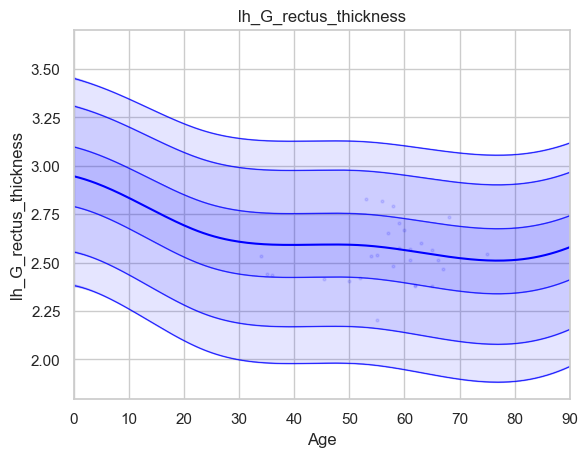

Running IDP 31 lh_G_subcallosal_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.19313273]), 'Rho': array([0.29911312]), 'pRho': array([0.08581349]), 'SMSE': array([1.45470961]), 'EXPV': array([0.08798923])}


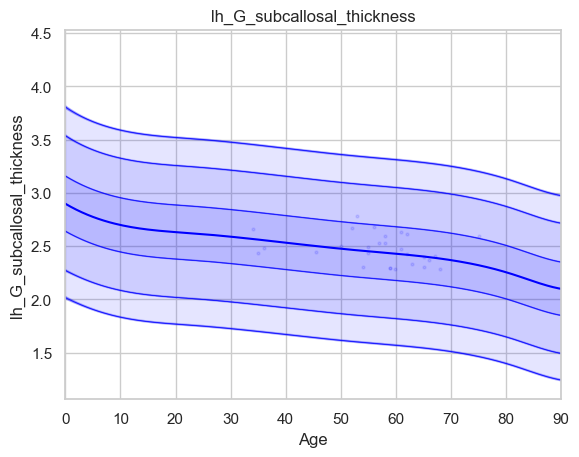

Running IDP 32 lh_G_temp_sup-G_T_transv_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.21285525]), 'Rho': array([0.21734852]), 'pRho': array([0.21878688]), 'SMSE': array([1.03102274]), 'EXPV': array([0.03989683])}


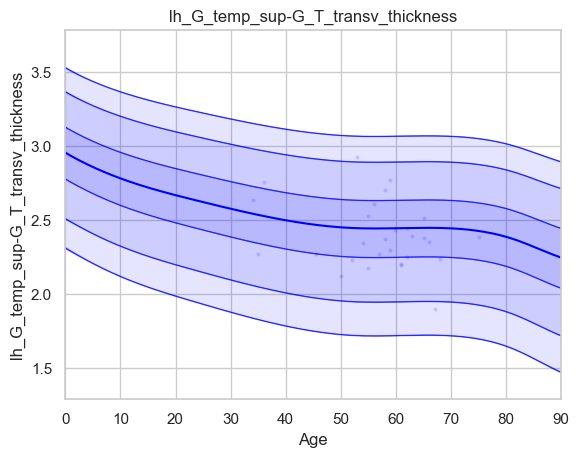

Running IDP 33 lh_G_temp_sup-Lateral_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.17288208]), 'Rho': array([0.25397812]), 'pRho': array([0.1482531]), 'SMSE': array([1.00369032]), 'EXPV': array([0.05808287])}


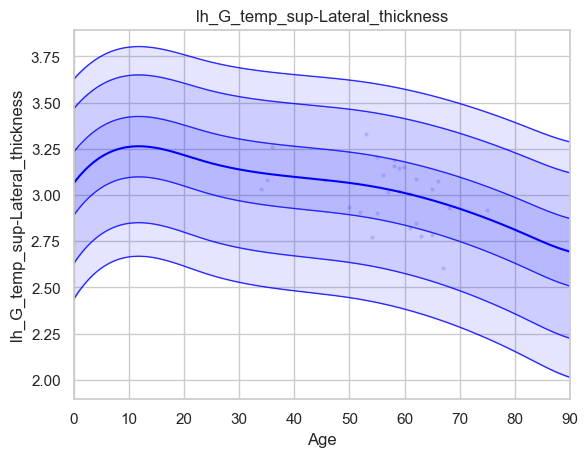

Running IDP 34 lh_G_temp_sup-Plan_polar_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.22938276]), 'Rho': array([0.25286251]), 'pRho': array([0.15012455]), 'SMSE': array([0.97904701]), 'EXPV': array([0.06282838])}


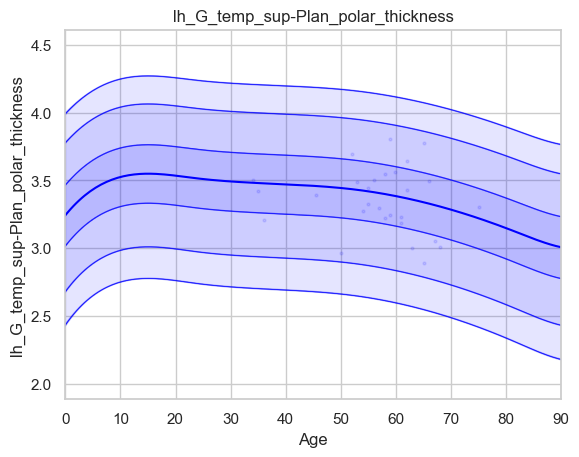

Running IDP 35 lh_G_temp_sup-Plan_tempo_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.14834051]), 'Rho': array([0.40082774]), 'pRho': array([0.01806583]), 'SMSE': array([0.92218602]), 'EXPV': array([0.15779544])}


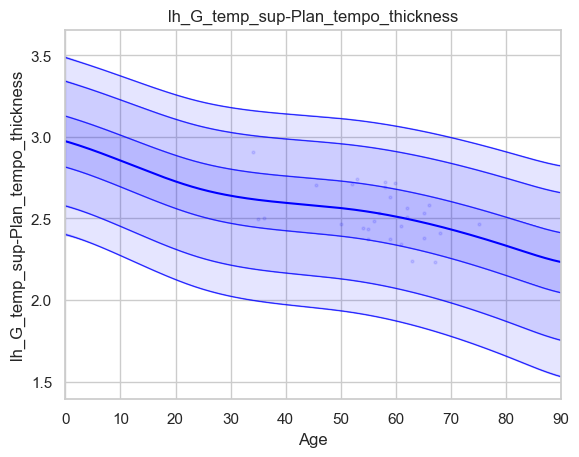

Running IDP 36 lh_G_temporal_inf_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.14574614]), 'Rho': array([0.2504225]), 'pRho': array([0.15427637]), 'SMSE': array([0.9467173]), 'EXPV': array([0.05587285])}


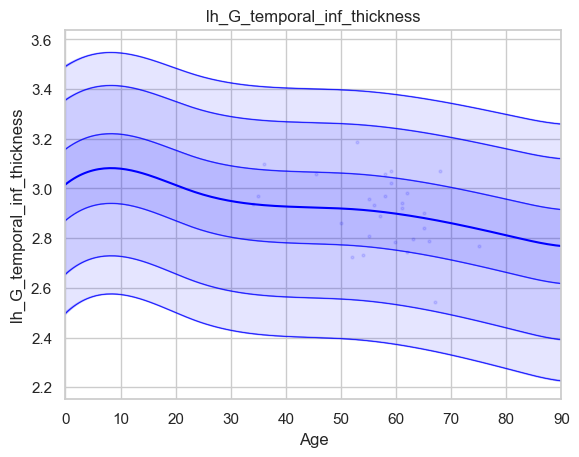

Running IDP 37 lh_G_temporal_middle_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.11272688]), 'Rho': array([0.37234635]), 'pRho': array([0.02942096]), 'SMSE': array([0.88899468]), 'EXPV': array([0.13607484])}


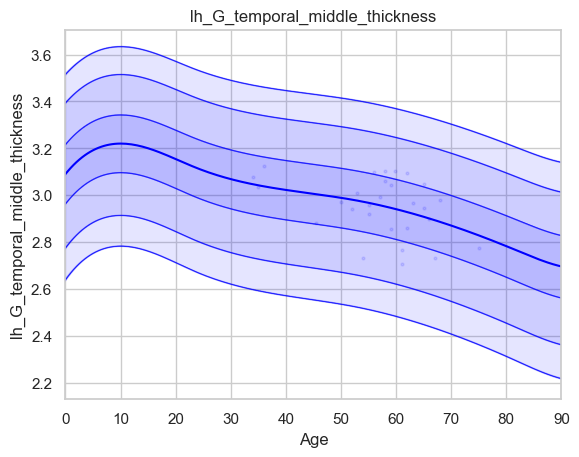

Running IDP 38 lh_Lat_Fis-ant-Horizont_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.20652433]), 'Rho': array([0.08310811]), 'pRho': array([0.64279379]), 'SMSE': array([1.27271341]), 'EXPV': array([-0.00222591])}


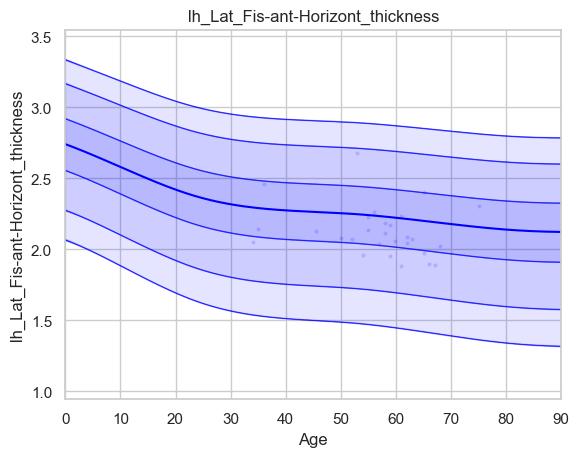

Running IDP 39 lh_Lat_Fis-ant-Vertical_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.25673348]), 'Rho': array([0.03283419]), 'pRho': array([0.85489313]), 'SMSE': array([1.43767102]), 'EXPV': array([-0.03608419])}


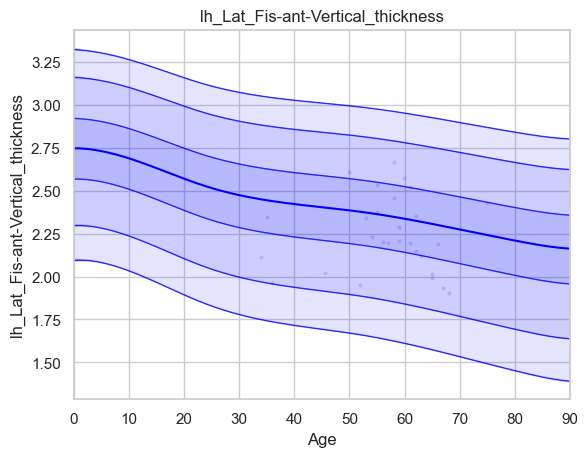

Running IDP 40 lh_Lat_Fis-post_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.13964272]), 'Rho': array([0.3657438]), 'pRho': array([0.03274127]), 'SMSE': array([1.03705286]), 'EXPV': array([0.13375192])}


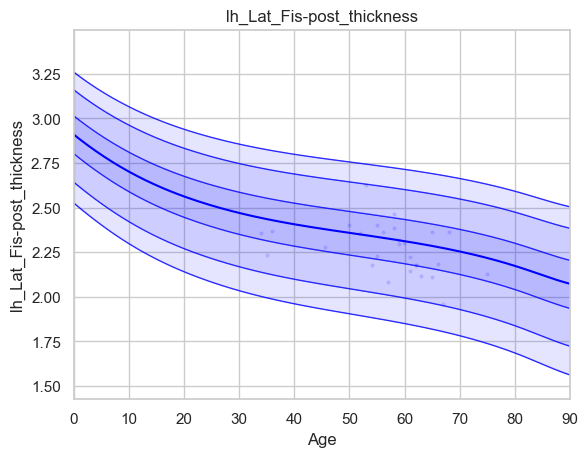

Running IDP 41 lh_Pole_occipital_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.16456571]), 'Rho': array([-0.16282424]), 'pRho': array([0.36034469]), 'SMSE': array([1.05903677]), 'EXPV': array([-0.04741562])}


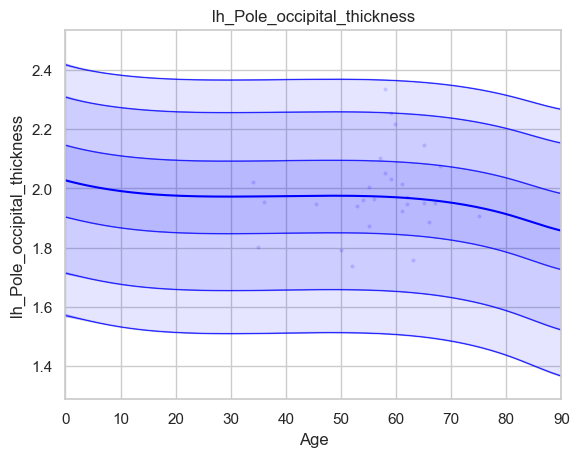

Running IDP 42 lh_Pole_temporal_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.16444088]), 'Rho': array([0.33434844]), 'pRho': array([0.05286759]), 'SMSE': array([1.0376949]), 'EXPV': array([0.08292651])}


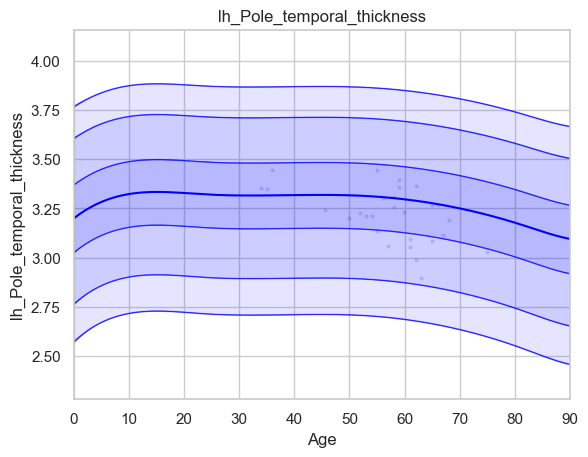

Running IDP 43 lh_S_calcarine_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.09812393]), 'Rho': array([-0.07548809]), 'pRho': array([0.67368135]), 'SMSE': array([1.28738099]), 'EXPV': array([-0.18151328])}


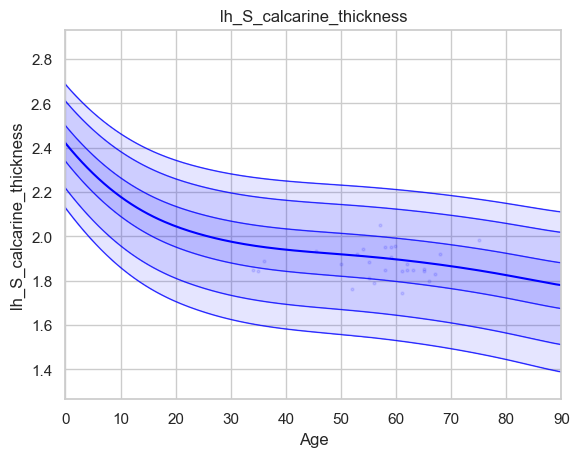

Running IDP 44 lh_S_central_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.11160807]), 'Rho': array([0.27952127]), 'pRho': array([0.109853]), 'SMSE': array([1.06991676]), 'EXPV': array([0.07357906])}


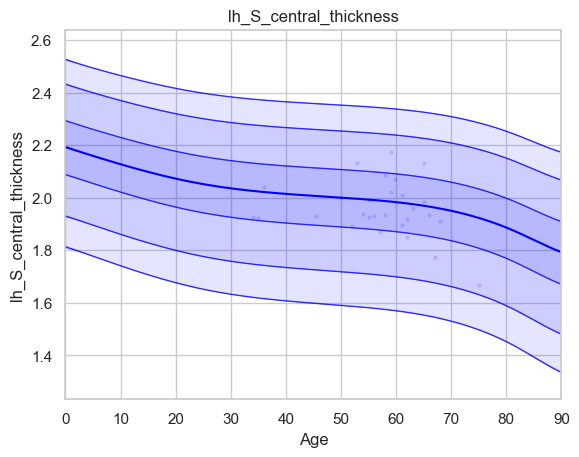

Running IDP 45 lh_S_cingul-Marginalis_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.11195795]), 'Rho': array([0.19413165]), 'pRho': array([0.273616]), 'SMSE': array([1.04165322]), 'EXPV': array([0.023015])}


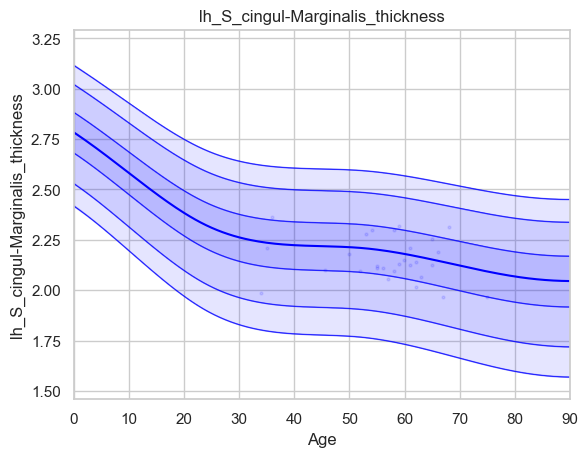

Running IDP 46 lh_S_circular_insula_ant_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.17292361]), 'Rho': array([-0.10357241]), 'pRho': array([0.56276317]), 'SMSE': array([1.41589729]), 'EXPV': array([-0.14031191])}


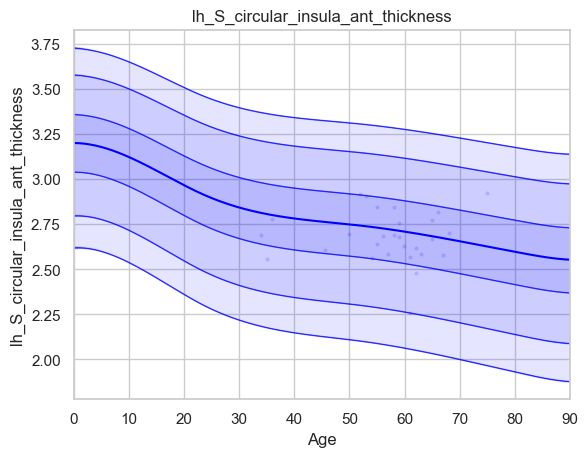

Running IDP 47 lh_S_circular_insula_inf_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.16857722]), 'Rho': array([0.5245721]), 'pRho': array([0.00117893]), 'SMSE': array([0.75662679]), 'EXPV': array([0.24352027])}


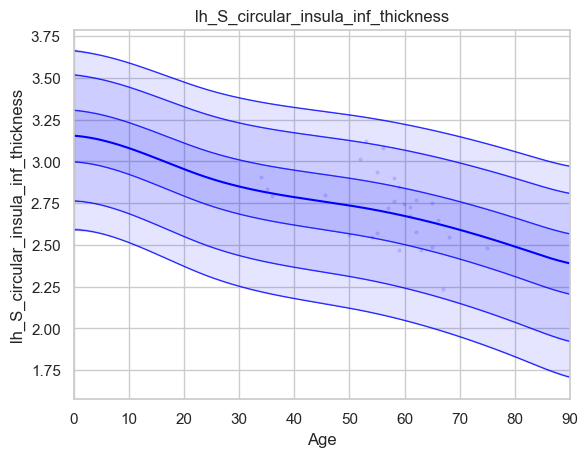

Running IDP 48 lh_S_circular_insula_sup_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.12832362]), 'Rho': array([0.34978327]), 'pRho': array([0.04201923]), 'SMSE': array([1.01020616]), 'EXPV': array([0.12197946])}


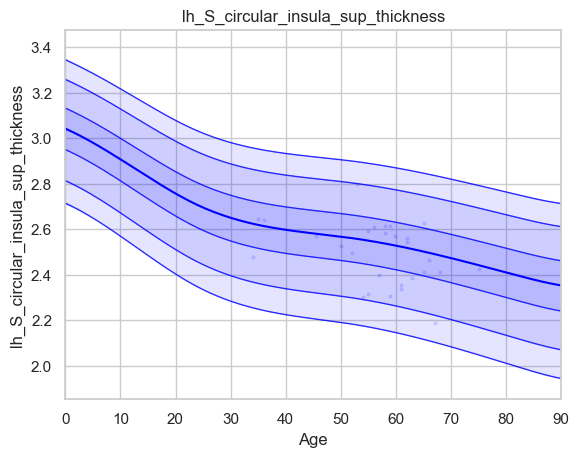

Running IDP 49 lh_S_collat_transv_ant_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.16695626]), 'Rho': array([0.0013812]), 'pRho': array([0.99386419]), 'SMSE': array([1.02867028]), 'EXPV': array([-0.01531813])}


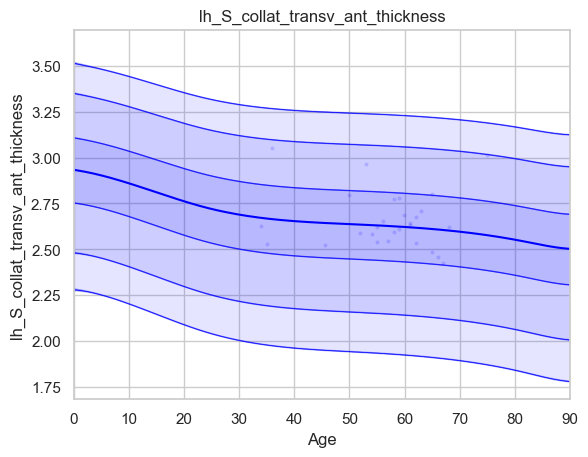

Running IDP 50 lh_S_collat_transv_post_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.17974815]), 'Rho': array([0.21944535]), 'pRho': array([0.21422929]), 'SMSE': array([0.96079105]), 'EXPV': array([0.0414485])}


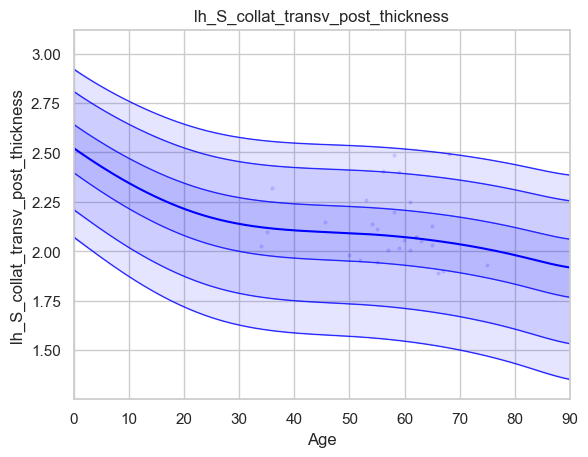

Running IDP 51 lh_S_front_inf_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.12308533]), 'Rho': array([0.26126952]), 'pRho': array([0.13643144]), 'SMSE': array([1.18485279]), 'EXPV': array([0.0637665])}


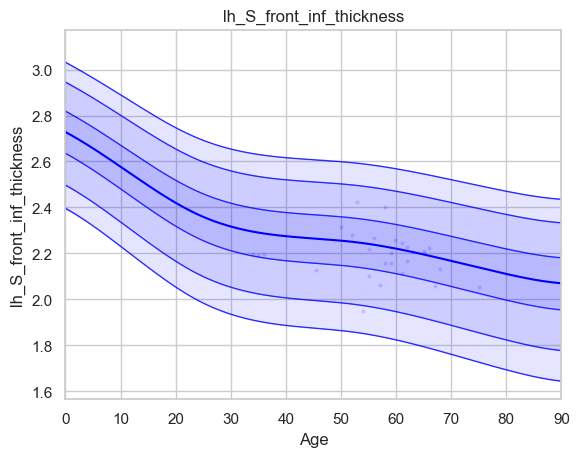

Running IDP 52 lh_S_front_middle_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.13068886]), 'Rho': array([0.15415481]), 'pRho': array([0.38693176]), 'SMSE': array([1.12048276]), 'EXPV': array([-0.00223505])}


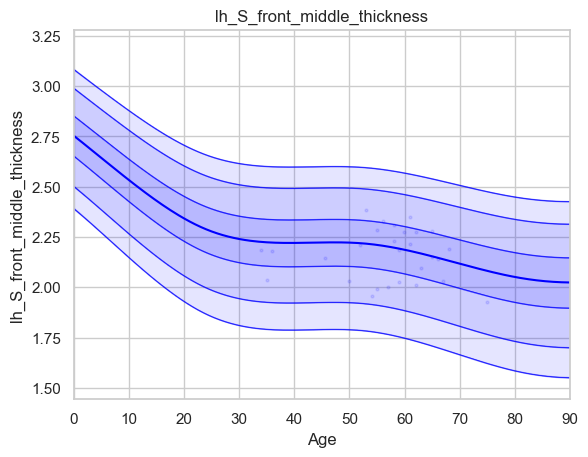

Running IDP 53 lh_S_front_sup_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.1230987]), 'Rho': array([0.17531378]), 'pRho': array([0.32398859]), 'SMSE': array([1.2189213]), 'EXPV': array([-0.01291755])}


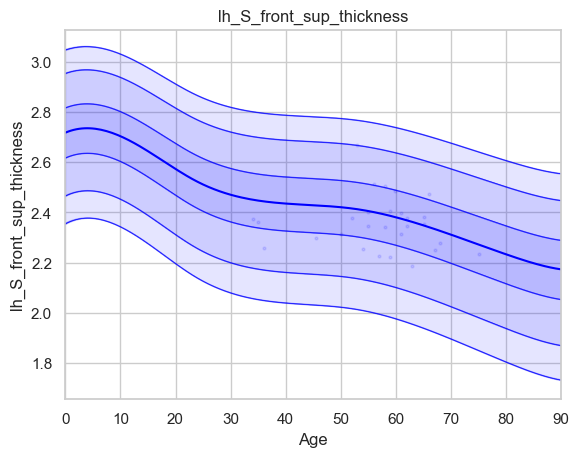

Running IDP 54 lh_S_interm_prim-Jensen_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.36187937]), 'Rho': array([0.20479416]), 'pRho': array([0.2474358]), 'SMSE': array([0.9758729]), 'EXPV': array([0.03811133])}


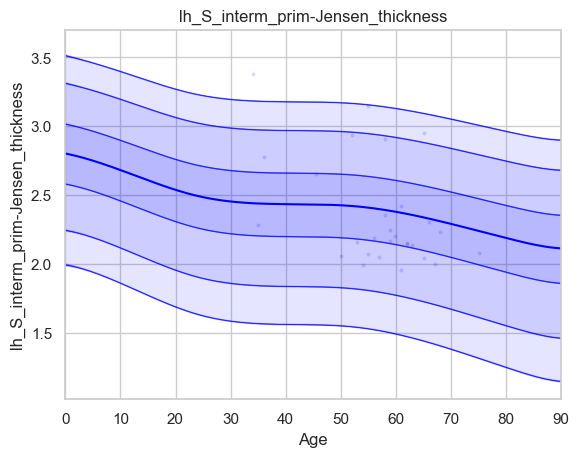

Running IDP 55 lh_S_intrapariet&P_trans_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.21430582]), 'Rho': array([0.]), 'pRho': array([1.]), 'SMSE': array([0.]), 'EXPV': array([0.])}


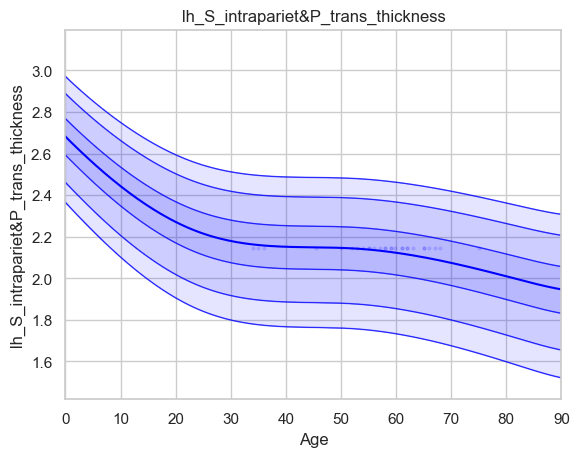

Running IDP 56 lh_S_oc_middle&Lunatus_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.14524059]), 'Rho': array([0.]), 'pRho': array([1.]), 'SMSE': array([0.]), 'EXPV': array([0.])}


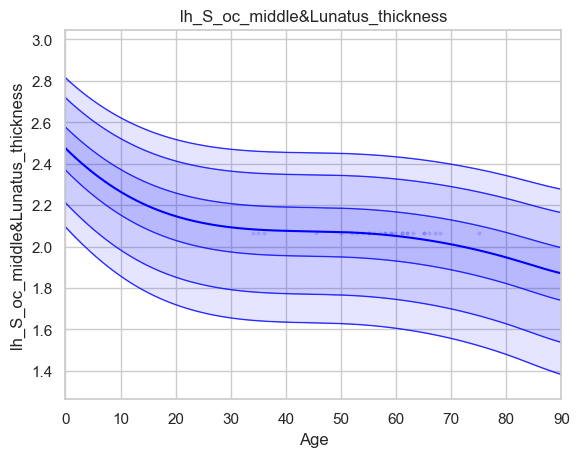

Running IDP 57 lh_S_oc_sup&transversal_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.15626109]), 'Rho': array([0.]), 'pRho': array([1.]), 'SMSE': array([0.]), 'EXPV': array([0.])}


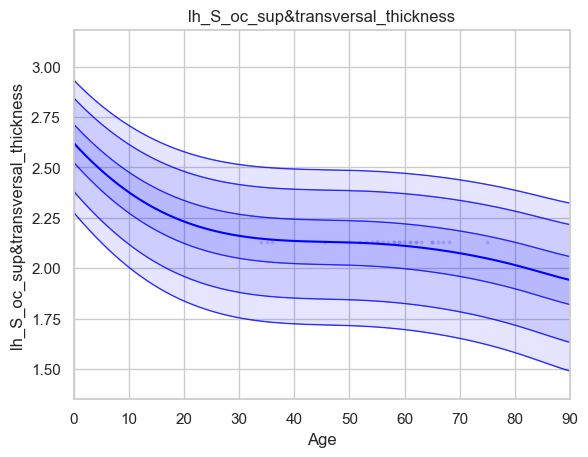

Running IDP 58 lh_S_occipital_ant_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.15785544]), 'Rho': array([0.05908669]), 'pRho': array([0.74188024]), 'SMSE': array([1.06268645]), 'EXPV': array([-0.01581257])}


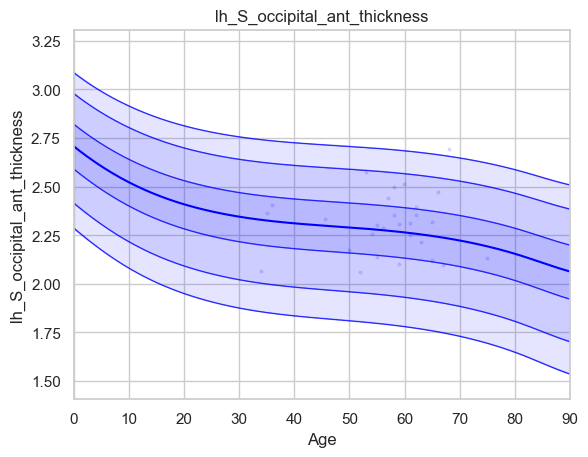

Running IDP 59 lh_S_oc-temp_lat_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.11895166]), 'Rho': array([0.3478006]), 'pRho': array([0.04330445]), 'SMSE': array([0.9458806]), 'EXPV': array([0.06882827])}


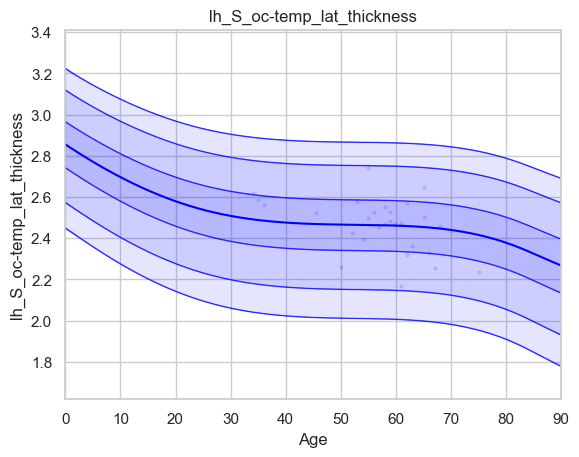

Running IDP 60 lh_S_oc-temp_med&Lingual_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.310548]), 'Rho': array([0.]), 'pRho': array([1.]), 'SMSE': array([0.]), 'EXPV': array([0.])}


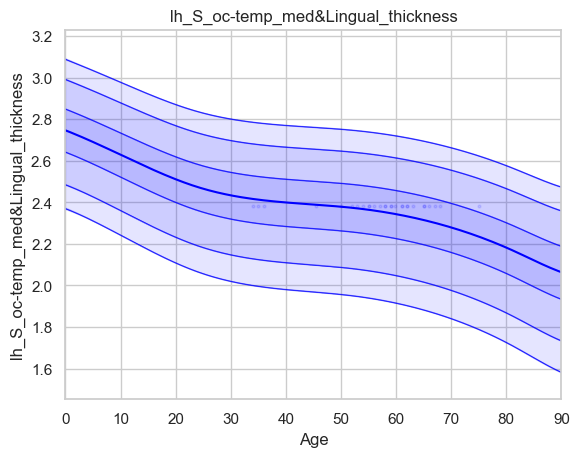

Running IDP 61 lh_S_orbital_lateral_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.26226903]), 'Rho': array([0.13360688]), 'pRho': array([0.45423942]), 'SMSE': array([1.04139098]), 'EXPV': array([0.01784202])}


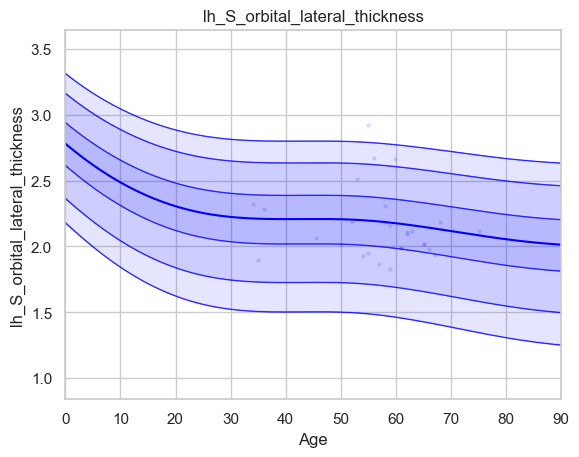

Running IDP 62 lh_S_orbital_med-olfact_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.12987072]), 'Rho': array([0.1025193]), 'pRho': array([0.56676943]), 'SMSE': array([1.07472813]), 'EXPV': array([0.00128176])}


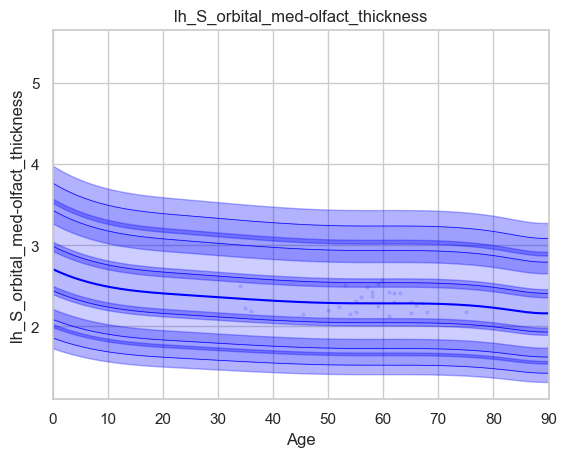

Running IDP 63 lh_S_orbital-H_Shaped_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.16485685]), 'Rho': array([0.03803136]), 'pRho': array([0.83222262]), 'SMSE': array([1.14276745]), 'EXPV': array([0.00119076])}


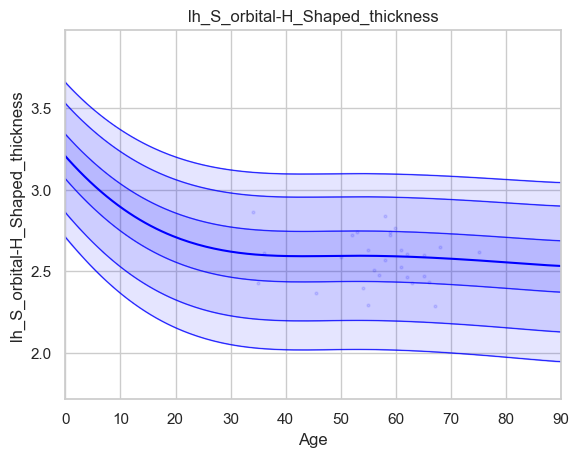

Running IDP 64 lh_S_parieto_occipital_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.13766669]), 'Rho': array([0.19319334]), 'pRho': array([0.27600161]), 'SMSE': array([1.07771998]), 'EXPV': array([0.02494808])}


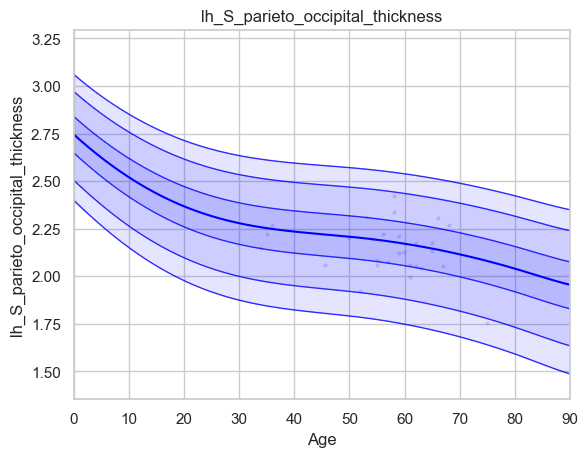

Running IDP 65 lh_S_pericallosal_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.21246164]), 'Rho': array([-0.01185033]), 'pRho': array([0.94739142]), 'SMSE': array([1.10004598]), 'EXPV': array([-0.03039187])}


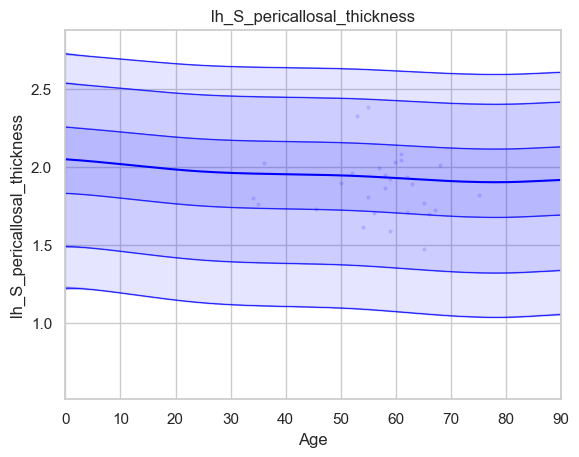

Running IDP 66 lh_S_postcentral_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.10698548]), 'Rho': array([0.41443023]), 'pRho': array([0.01408467]), 'SMSE': array([0.85503158]), 'EXPV': array([0.16647429])}


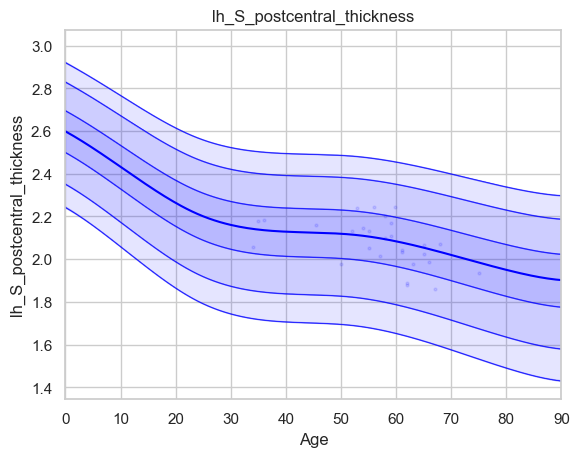

Running IDP 67 lh_S_precentral-inf-part_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.13252921]), 'Rho': array([0.42820014]), 'pRho': array([0.01082451]), 'SMSE': array([0.95464983]), 'EXPV': array([0.17068147])}


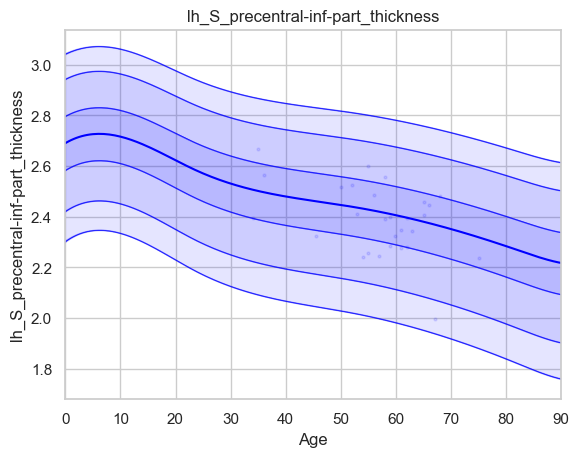

Running IDP 68 lh_S_precentral-sup-part_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.14452372]), 'Rho': array([0.4357715]), 'pRho': array([0.00931854]), 'SMSE': array([0.83362958]), 'EXPV': array([0.17180071])}


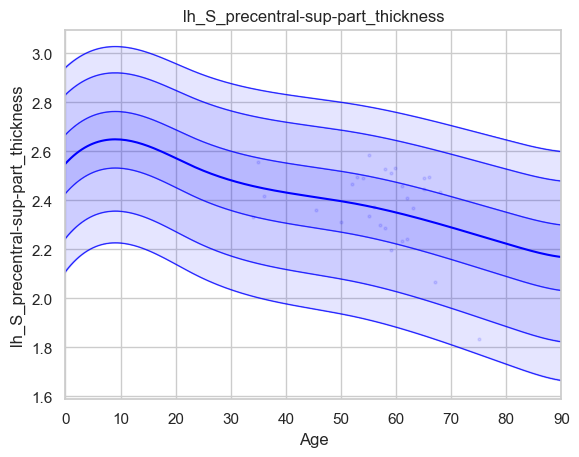

Running IDP 69 lh_S_suborbital_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.20831963]), 'Rho': array([0.14103158]), 'pRho': array([0.429236]), 'SMSE': array([1.08861676]), 'EXPV': array([0.01315242])}


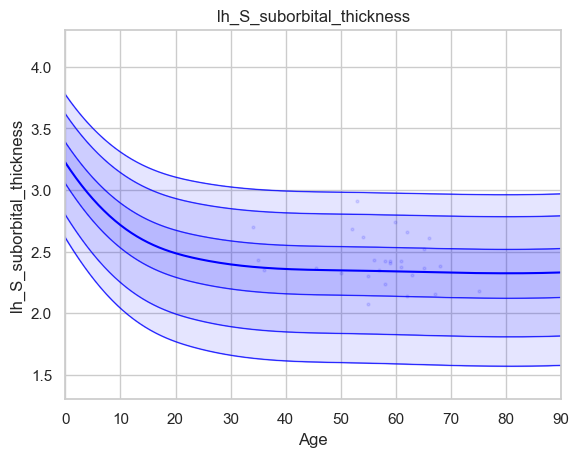

Running IDP 70 lh_S_subparietal_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.15209579]), 'Rho': array([0.26970119]), 'pRho': array([0.12362906]), 'SMSE': array([0.95350791]), 'EXPV': array([0.06399838])}


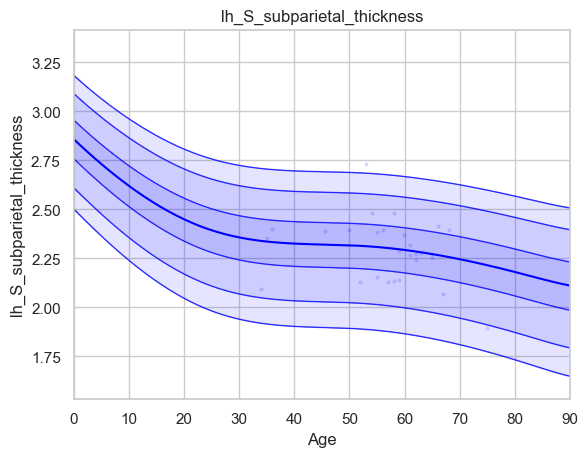

Running IDP 71 lh_S_temporal_inf_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.14917457]), 'Rho': array([0.14357071]), 'pRho': array([0.42086057]), 'SMSE': array([1.01393758]), 'EXPV': array([0.02059196])}


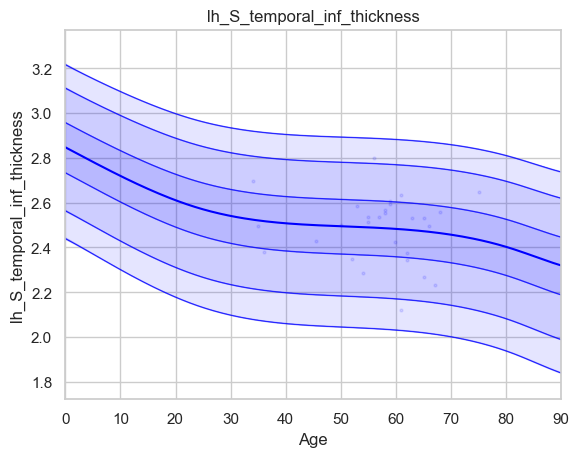

Running IDP 72 lh_S_temporal_sup_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.1028323]), 'Rho': array([0.35739551]), 'pRho': array([0.03736354]), 'SMSE': array([1.03146172]), 'EXPV': array([0.12657783])}


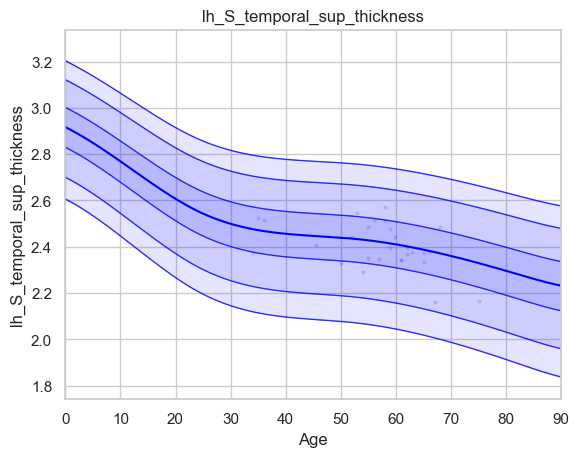

Running IDP 73 lh_S_temporal_transverse_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.28016441]), 'Rho': array([0.5621403]), 'pRho': array([0.00039883]), 'SMSE': array([0.97065286]), 'EXPV': array([0.18775644])}


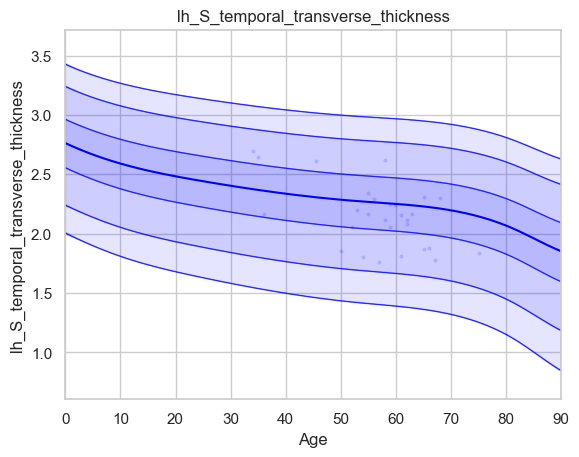

Running IDP 74 lh_MeanThickness_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.07868213]), 'Rho': array([0.39915713]), 'pRho': array([0.01861298]), 'SMSE': array([0.93046416]), 'EXPV': array([0.1532871])}


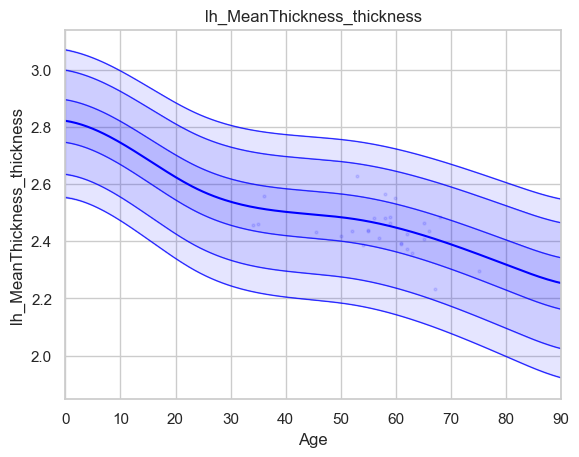

Running IDP 75 rh_G&S_frontomargin_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.17518853]), 'Rho': array([0.05796663]), 'pRho': array([0.74661441]), 'SMSE': array([1.08252392]), 'EXPV': array([0.00223708])}


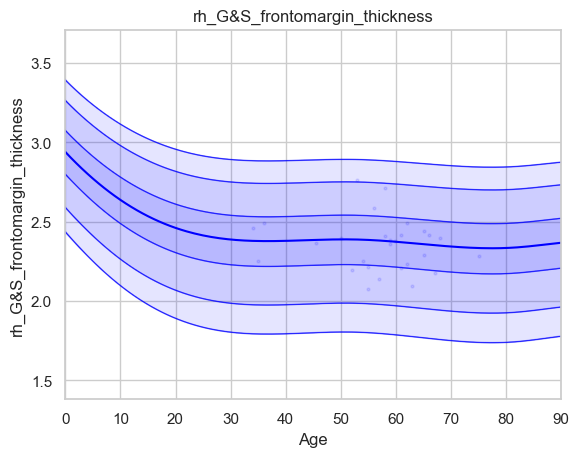

Running IDP 76 rh_G&S_occipital_inf_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.1807798]), 'Rho': array([0.03075979]), 'pRho': array([0.86397427]), 'SMSE': array([1.02222047]), 'EXPV': array([-0.00944245])}


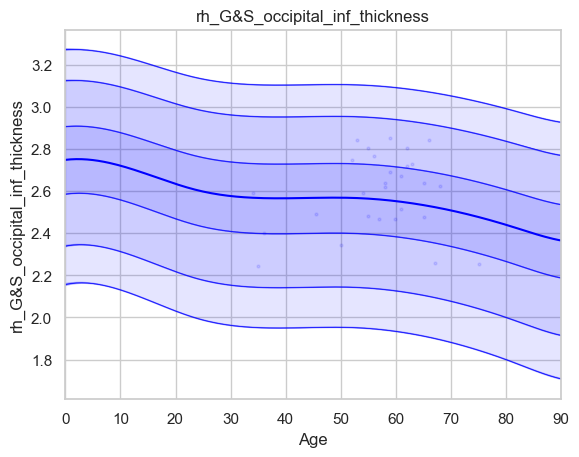

Running IDP 77 rh_G&S_paracentral_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.16057521]), 'Rho': array([0.32257694]), 'pRho': array([0.0625281]), 'SMSE': array([1.00397356]), 'EXPV': array([0.10378355])}


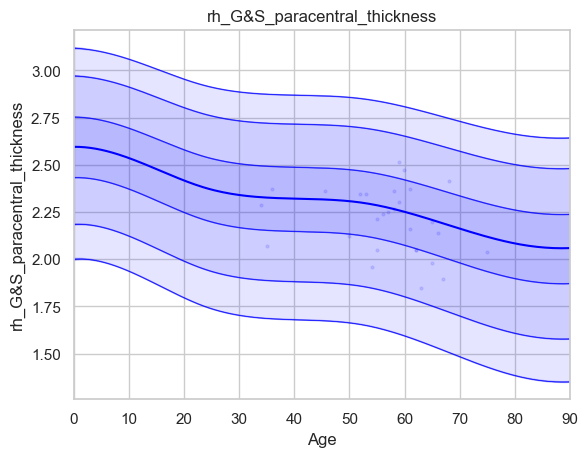

Running IDP 78 rh_G&S_subcentral_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.15434286]), 'Rho': array([0.36380383]), 'pRho': array([0.03377207]), 'SMSE': array([1.09837594]), 'EXPV': array([0.12968277])}


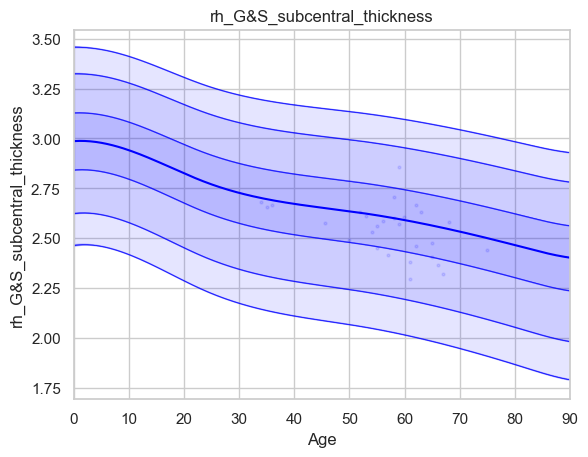

Running IDP 79 rh_G&S_transv_frontopol_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.18044975]), 'Rho': array([0.07453323]), 'pRho': array([0.67758967]), 'SMSE': array([2.27494537]), 'EXPV': array([-0.04345935])}


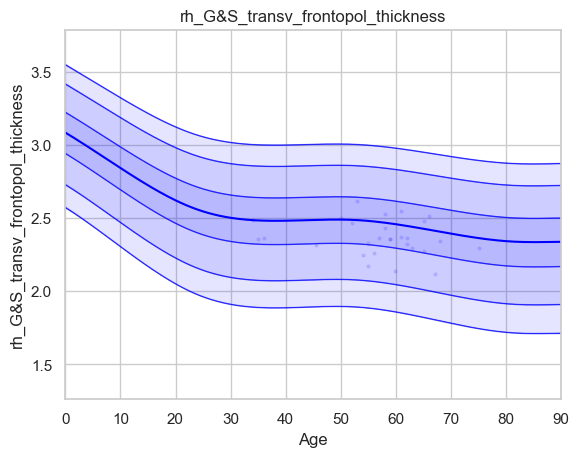

Running IDP 80 rh_G&S_cingul-Ant_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.15511558]), 'Rho': array([0.41307342]), 'pRho': array([0.01444583]), 'SMSE': array([1.06512948]), 'EXPV': array([0.09751556])}


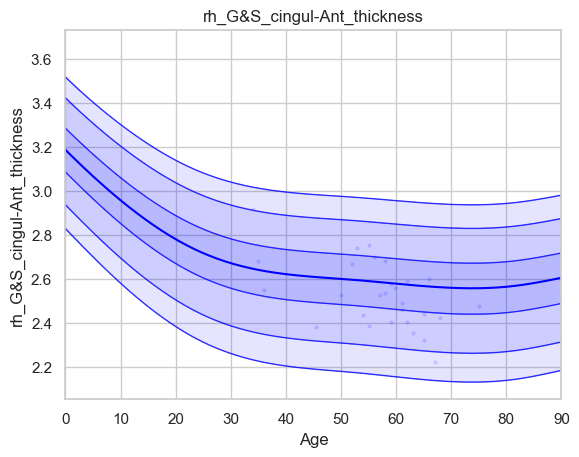

Running IDP 81 rh_G&S_cingul-Mid-Ant_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.1181408]), 'Rho': array([0.52411448]), 'pRho': array([0.00119356]), 'SMSE': array([0.81227904]), 'EXPV': array([0.25534057])}


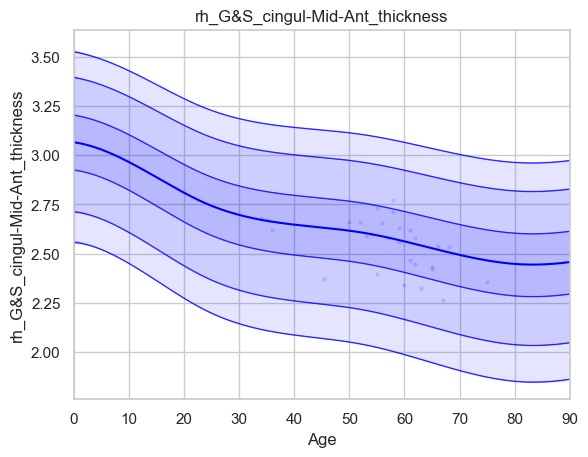

Running IDP 82 rh_G&S_cingul-Mid-Post_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.1249975]), 'Rho': array([0.43570385]), 'pRho': array([0.00933117]), 'SMSE': array([0.86002202]), 'EXPV': array([0.17274687])}


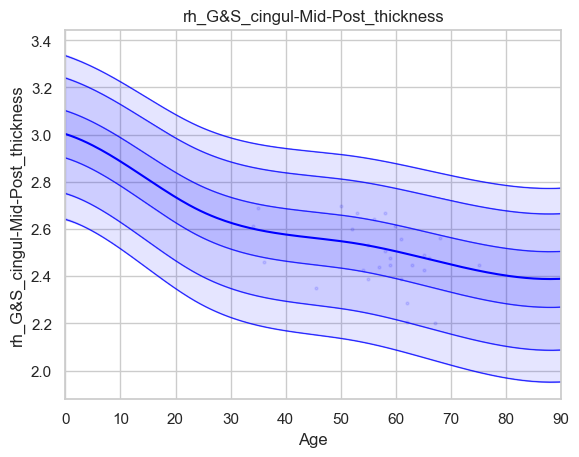

Running IDP 83 rh_G_cingul-Post-dorsal_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.15906764]), 'Rho': array([0.60426309]), 'pRho': array([9.75860165e-05]), 'SMSE': array([0.76187371]), 'EXPV': array([0.24017849])}


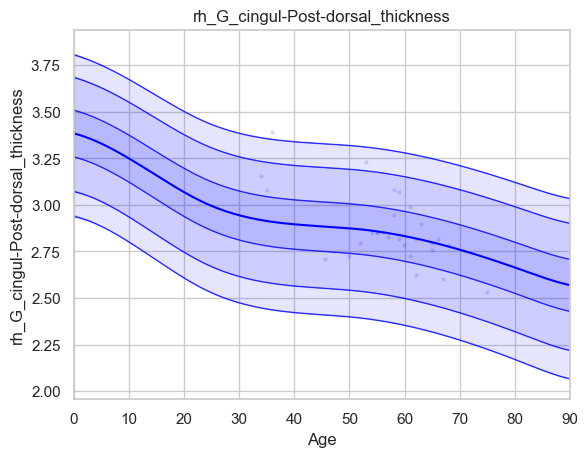

Running IDP 84 rh_G_cingul-Post-ventral_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.26778727]), 'Rho': array([0.49348302]), 'pRho': array([0.00261045]), 'SMSE': array([1.1118438]), 'EXPV': array([0.09198525])}


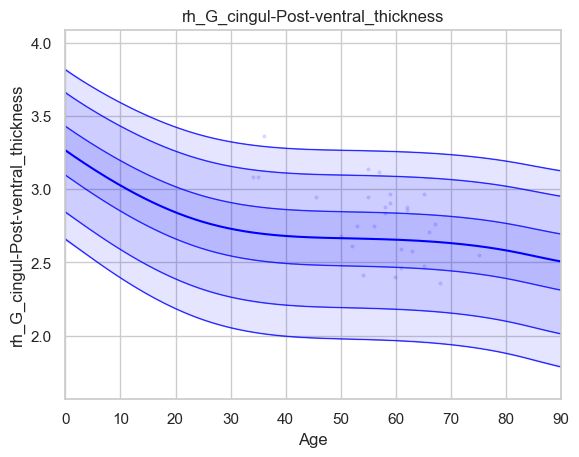

Running IDP 85 rh_G_cuneus_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.10098427]), 'Rho': array([-0.20448374]), 'pRho': array([0.24817389]), 'SMSE': array([1.17032479]), 'EXPV': array([-0.08488118])}


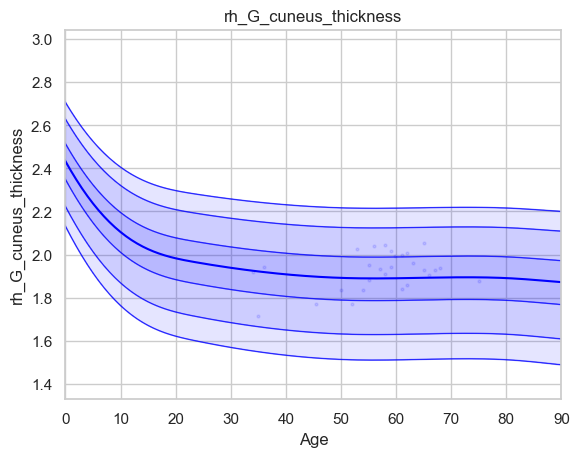

Running IDP 86 rh_G_front_inf-Opercular_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.12702709]), 'Rho': array([0.48232272]), 'pRho': array([0.00340403]), 'SMSE': array([1.10530518]), 'EXPV': array([0.2324251])}


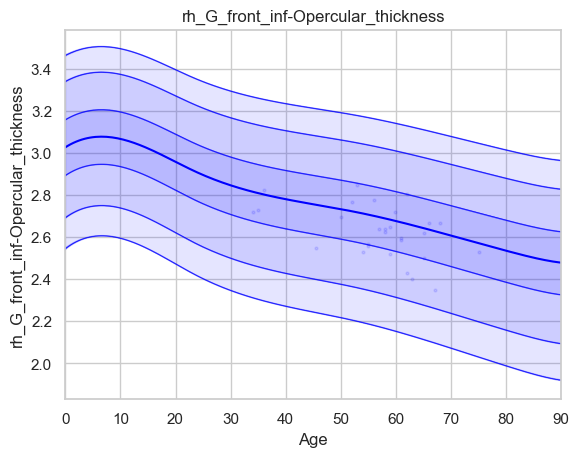

Running IDP 87 rh_G_front_inf-Orbital_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.19544981]), 'Rho': array([0.42212966]), 'pRho': array([0.01217413]), 'SMSE': array([0.85357407]), 'EXPV': array([0.15058564])}


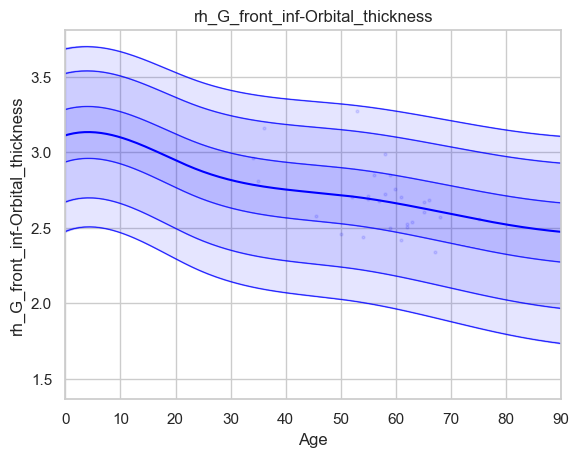

Running IDP 88 rh_G_front_inf-Triangul_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.13558756]), 'Rho': array([0.30490924]), 'pRho': array([0.07953028]), 'SMSE': array([0.91690939]), 'EXPV': array([0.08516064])}


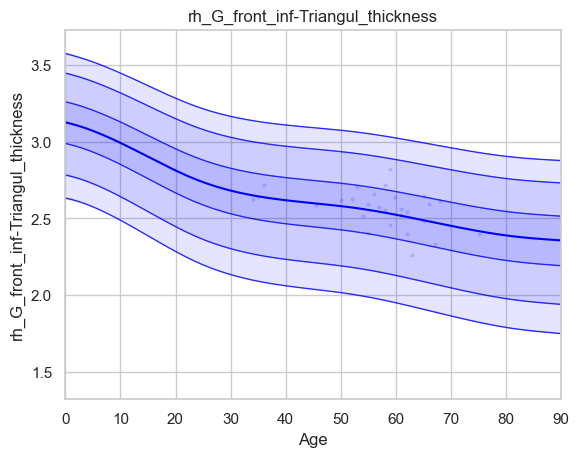

Running IDP 89 rh_G_front_middle_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.10756603]), 'Rho': array([0.29895134]), 'pRho': array([0.0859941]), 'SMSE': array([0.95802398]), 'EXPV': array([0.04613367])}


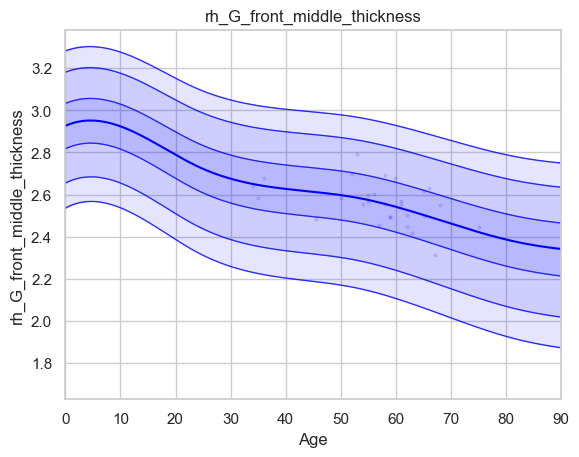

Running IDP 90 rh_G_front_sup_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.15101686]), 'Rho': array([0.46135318]), 'pRho': array([0.00546146]), 'SMSE': array([0.89799614]), 'EXPV': array([0.20671103])}


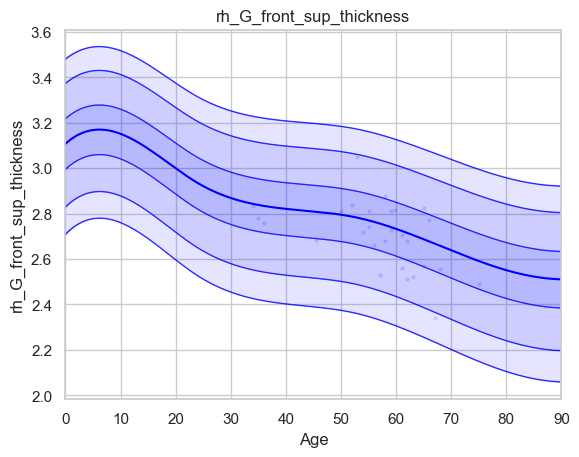

Running IDP 91 rh_G_Ins_lg&S_cent_ins_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.18756786]), 'Rho': array([0.]), 'pRho': array([1.]), 'SMSE': array([0.]), 'EXPV': array([0.])}


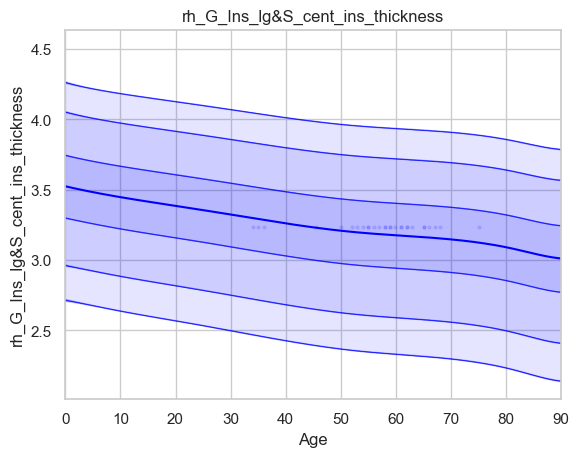

Running IDP 92 rh_G_insular_short_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.26009402]), 'Rho': array([0.05741408]), 'pRho': array([0.74895317]), 'SMSE': array([1.18493548]), 'EXPV': array([-0.00900724])}


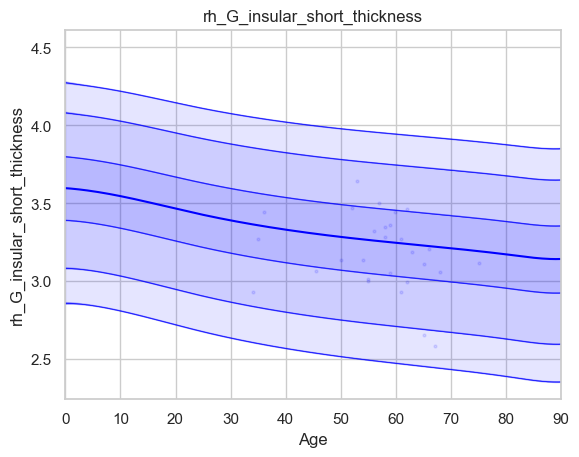

Running IDP 93 rh_G_occipital_middle_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.14808045]), 'Rho': array([-0.0013302]), 'pRho': array([0.99409073]), 'SMSE': array([1.08562436]), 'EXPV': array([-0.06210702])}


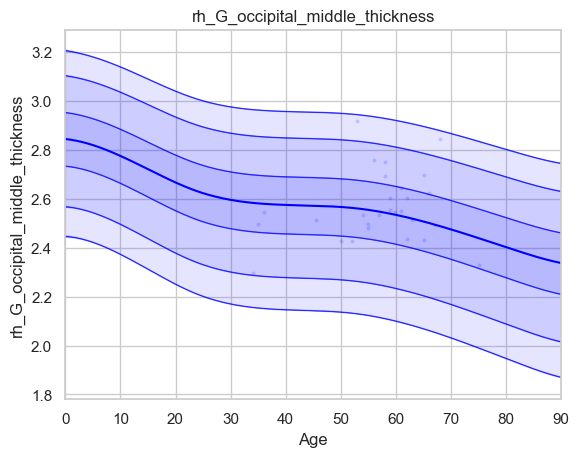

Running IDP 94 rh_G_occipital_sup_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.166048]), 'Rho': array([0.18618015]), 'pRho': array([0.29425178]), 'SMSE': array([0.96599878]), 'EXPV': array([0.03452706])}


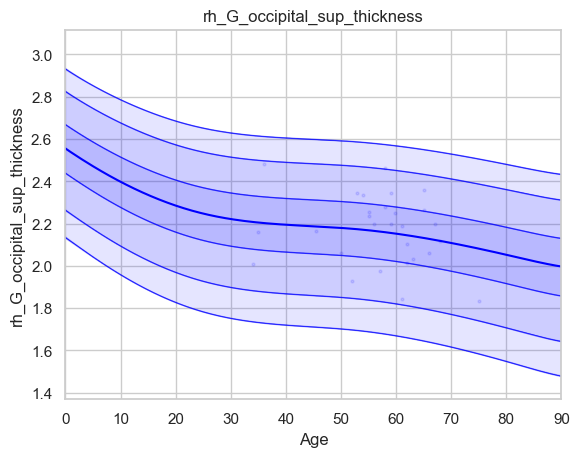

Running IDP 95 rh_G_oc-temp_lat-fusifor_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.16674989]), 'Rho': array([0.30546782]), 'pRho': array([0.07894381]), 'SMSE': array([0.95984303]), 'EXPV': array([0.08698477])}


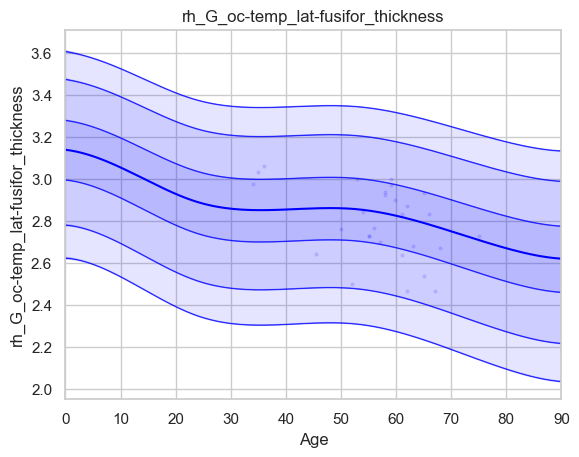

Running IDP 96 rh_G_oc-temp_med-Lingual_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.13185206]), 'Rho': array([0.10426129]), 'pRho': array([0.56014943]), 'SMSE': array([1.14719572]), 'EXPV': array([0.00736354])}


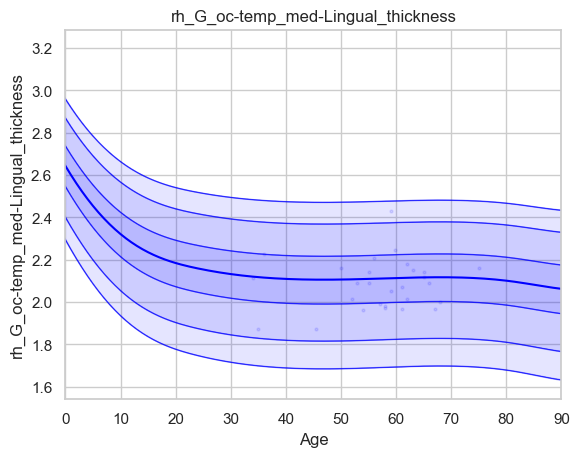

Running IDP 97 rh_G_oc-temp_med-Parahip_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.17698992]), 'Rho': array([0.06265228]), 'pRho': array([0.72687114]), 'SMSE': array([1.0664721]), 'EXPV': array([-0.00244104])}


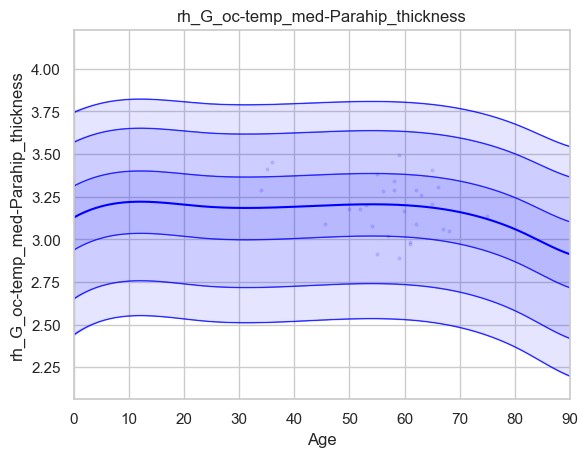

Running IDP 98 rh_G_orbital_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.14407205]), 'Rho': array([0.22971675]), 'pRho': array([0.19283205]), 'SMSE': array([1.07471214]), 'EXPV': array([0.05090124])}


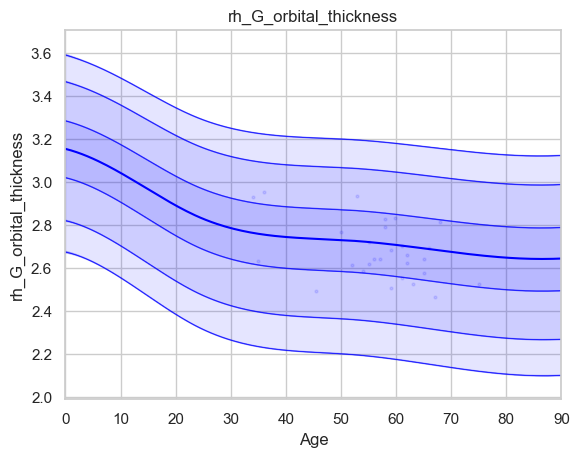

Running IDP 99 rh_G_pariet_inf-Angular_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.11195766]), 'Rho': array([0.30077008]), 'pRho': array([0.08398014]), 'SMSE': array([0.96340733]), 'EXPV': array([0.03860636])}


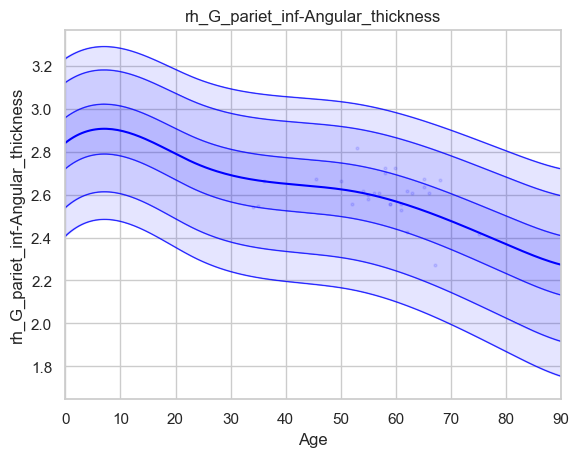

Running IDP 100 rh_G_pariet_inf-Supramar_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.11132325]), 'Rho': array([0.36454006]), 'pRho': array([0.03337785]), 'SMSE': array([0.87604172]), 'EXPV': array([0.123959])}


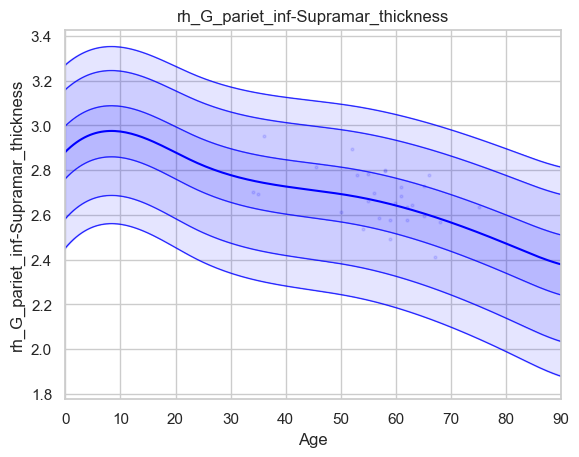

Running IDP 101 rh_G_parietal_sup_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.1287427]), 'Rho': array([0.17176351]), 'pRho': array([0.33408738]), 'SMSE': array([0.9962146]), 'EXPV': array([0.00509201])}


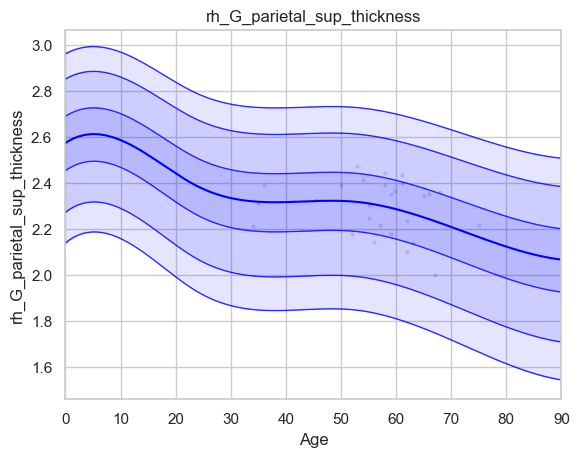

Running IDP 102 rh_G_postcentral_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.12140508]), 'Rho': array([0.23345911]), 'pRho': array([0.18541531]), 'SMSE': array([1.00781949]), 'EXPV': array([0.02638366])}


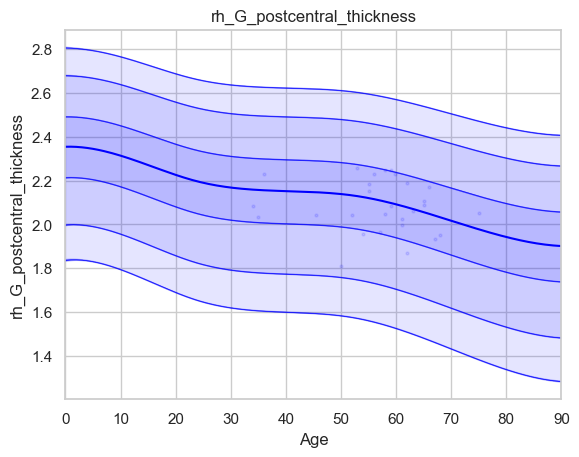

Running IDP 103 rh_G_precentral_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.15101085]), 'Rho': array([0.36824829]), 'pRho': array([0.03144806]), 'SMSE': array([0.93167868]), 'EXPV': array([0.11722583])}


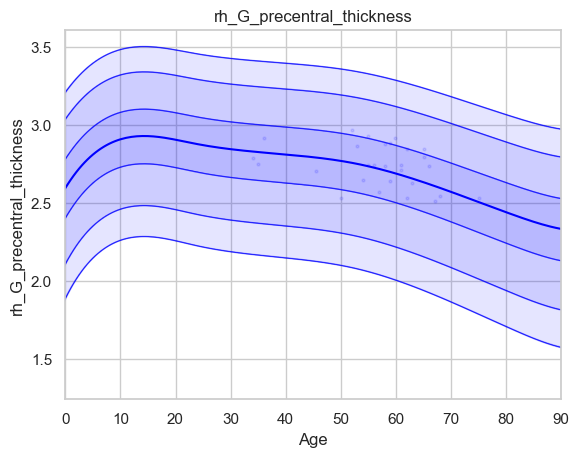

Running IDP 104 rh_G_precuneus_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.11139034]), 'Rho': array([0.33829108]), 'pRho': array([0.04990793]), 'SMSE': array([0.88555988]), 'EXPV': array([0.11444045])}


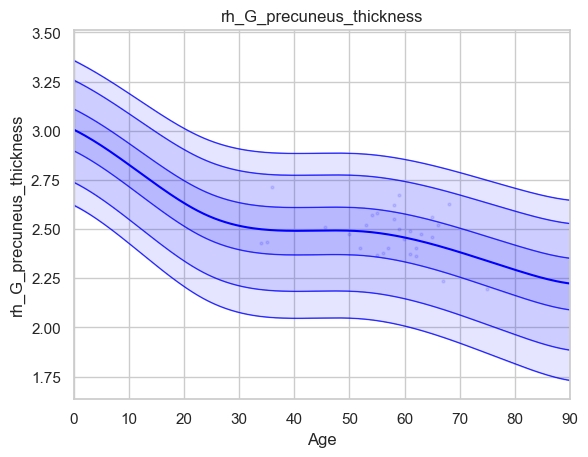

Running IDP 105 rh_G_rectus_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.14170877]), 'Rho': array([0.01308478]), 'pRho': array([0.94191983]), 'SMSE': array([1.0470316]), 'EXPV': array([-0.0401624])}


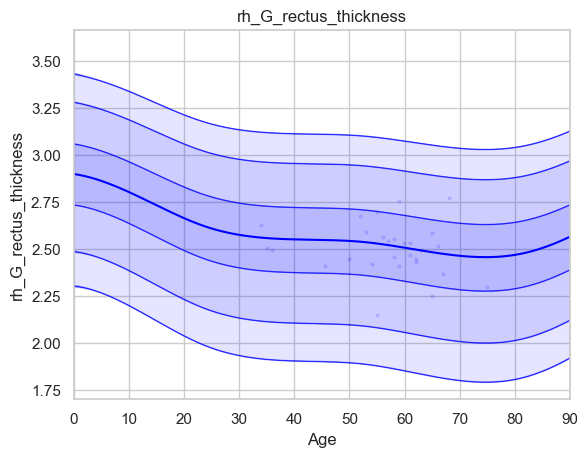

Running IDP 106 rh_G_subcallosal_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.26495593]), 'Rho': array([0.02195532]), 'pRho': array([0.90269176]), 'SMSE': array([1.10483654]), 'EXPV': array([-0.0150438])}


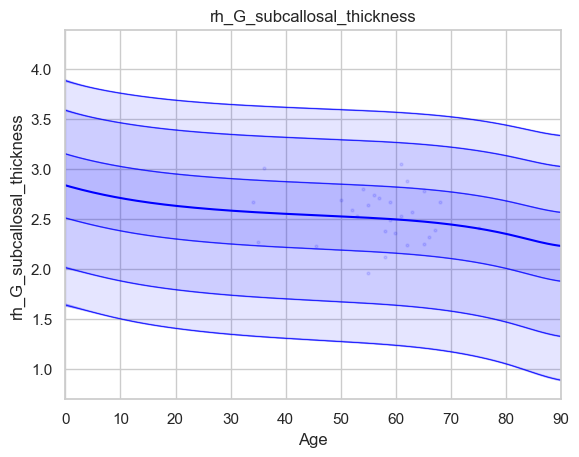

Running IDP 107 rh_G_temp_sup-G_T_transv_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.24909269]), 'Rho': array([0.12463089]), 'pRho': array([0.4854636]), 'SMSE': array([1.20091238]), 'EXPV': array([0.01550025])}


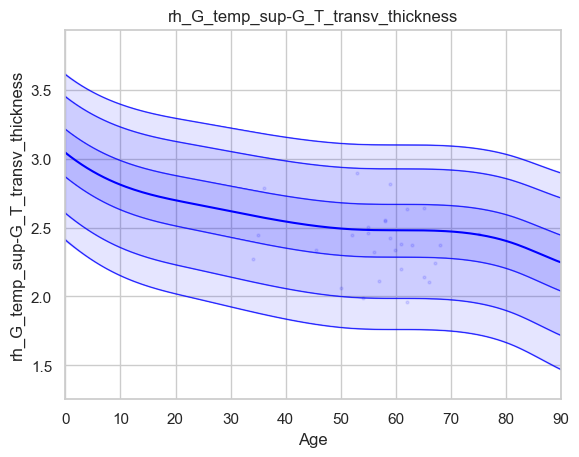

Running IDP 108 rh_G_temp_sup-Lateral_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.16980566]), 'Rho': array([0.20337123]), 'pRho': array([0.25083102]), 'SMSE': array([1.02600478]), 'EXPV': array([0.01323342])}


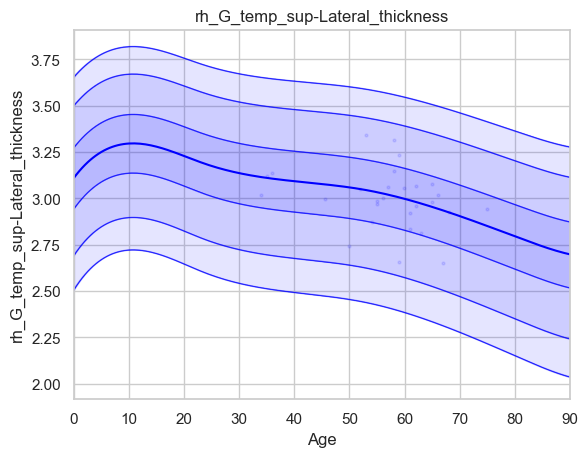

Running IDP 109 rh_G_temp_sup-Plan_polar_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.2400751]), 'Rho': array([0.21462367]), 'pRho': array([0.22480631]), 'SMSE': array([0.96959043]), 'EXPV': array([0.04504958])}


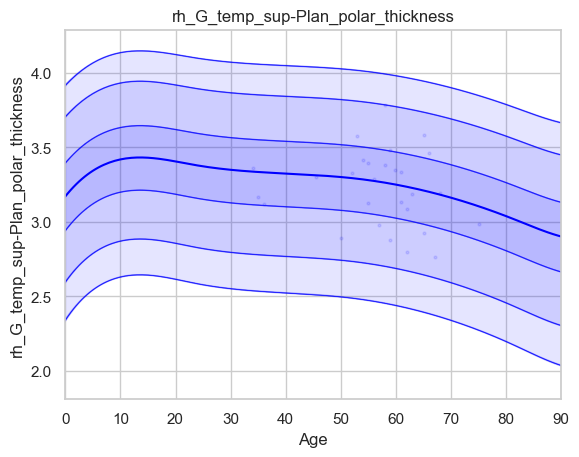

Running IDP 110 rh_G_temp_sup-Plan_tempo_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.16209917]), 'Rho': array([0.35569556]), 'pRho': array([0.03836571]), 'SMSE': array([0.88966613]), 'EXPV': array([0.12646412])}


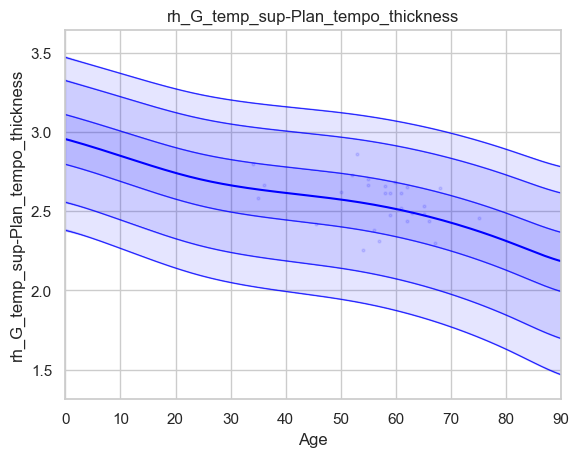

Running IDP 111 rh_G_temporal_inf_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.16947678]), 'Rho': array([0.43281817]), 'pRho': array([0.0098836]), 'SMSE': array([1.17741603]), 'EXPV': array([0.12814354])}


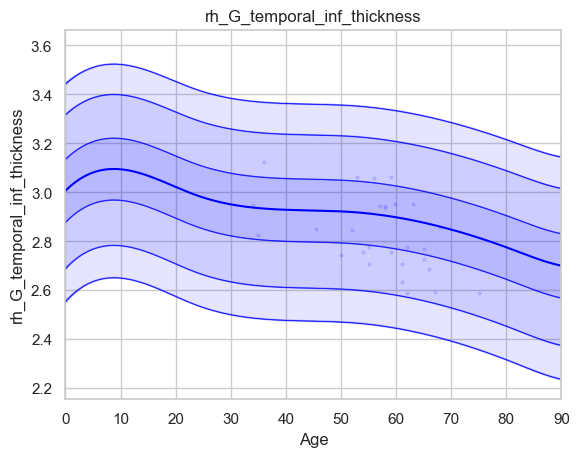

Running IDP 112 rh_G_temporal_middle_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.14633591]), 'Rho': array([0.26899992]), 'pRho': array([0.12465903]), 'SMSE': array([0.93132286]), 'EXPV': array([0.06941159])}


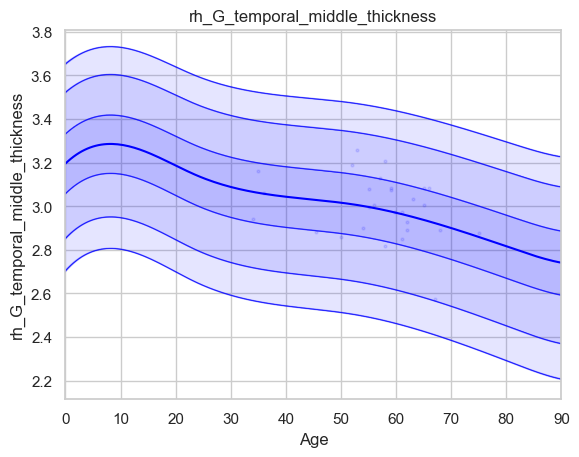

Running IDP 113 rh_Lat_Fis-ant-Horizont_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.22007375]), 'Rho': array([0.25506288]), 'pRho': array([0.14644948]), 'SMSE': array([0.94219475]), 'EXPV': array([0.05876585])}


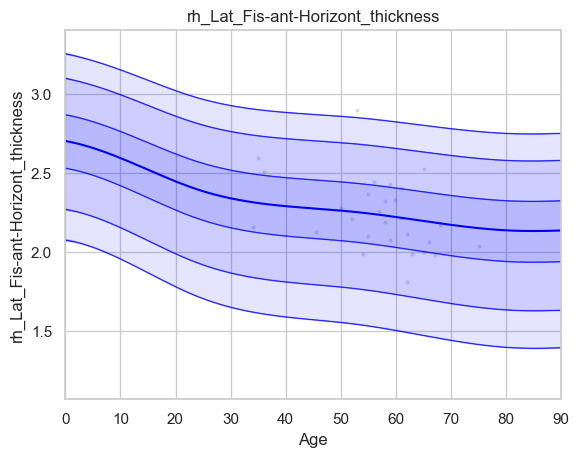

Running IDP 114 rh_Lat_Fis-ant-Vertical_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.23217496]), 'Rho': array([0.41367967]), 'pRho': array([0.01428352]), 'SMSE': array([1.02234988]), 'EXPV': array([0.13115703])}


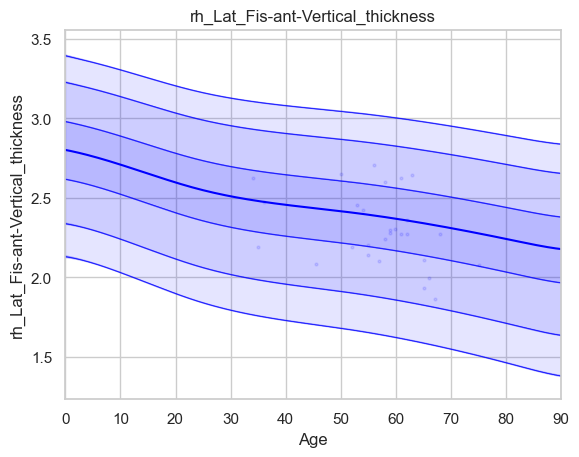

Running IDP 115 rh_Lat_Fis-post_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.14357008]), 'Rho': array([0.58435728]), 'pRho': array([0.00019521]), 'SMSE': array([0.76264969]), 'EXPV': array([0.27763481])}


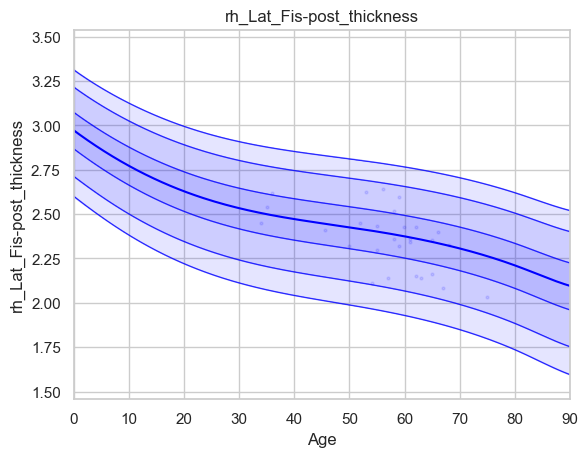

Running IDP 116 rh_Pole_occipital_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.13818158]), 'Rho': array([-0.14645291]), 'pRho': array([0.41146327]), 'SMSE': array([1.0513419]), 'EXPV': array([-0.04106734])}


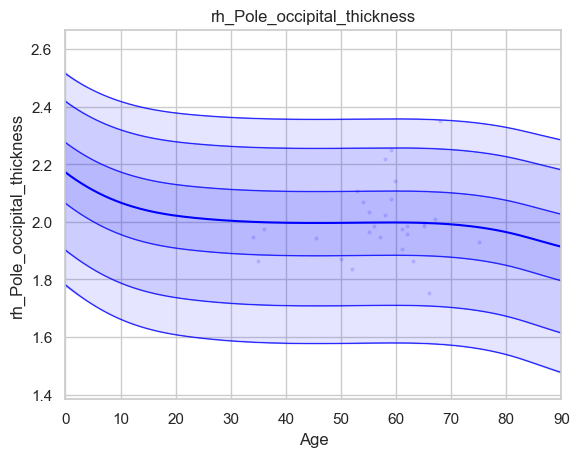

Running IDP 117 rh_Pole_temporal_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.19387066]), 'Rho': array([0.1252333]), 'pRho': array([0.4833346]), 'SMSE': array([1.20140095]), 'EXPV': array([0.01481956])}


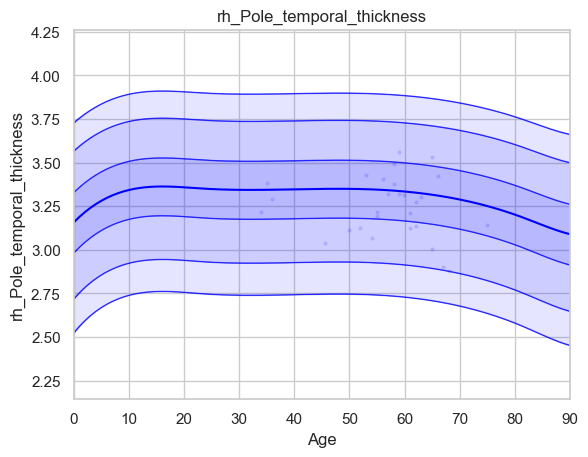

Running IDP 118 rh_S_calcarine_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.1159837]), 'Rho': array([-0.03179449]), 'pRho': array([0.85944247]), 'SMSE': array([1.10324341]), 'EXPV': array([-0.0802325])}


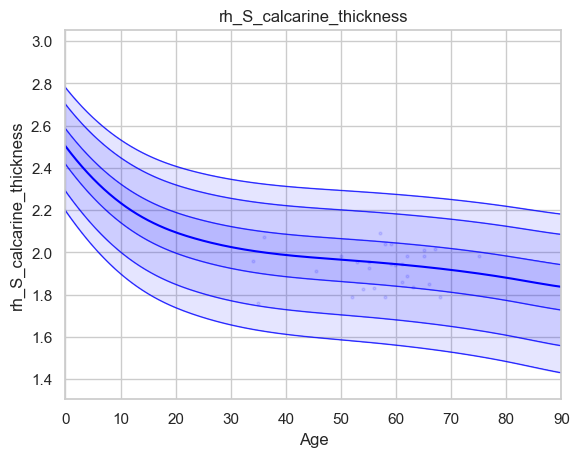

Running IDP 119 rh_S_central_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.09176763]), 'Rho': array([0.3006496]), 'pRho': array([0.08411244]), 'SMSE': array([0.92725271]), 'EXPV': array([0.09005124])}


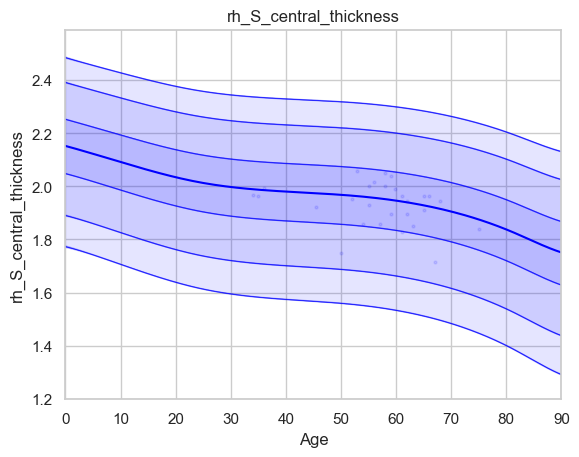

Running IDP 120 rh_S_cingul-Marginalis_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.13779829]), 'Rho': array([0.17526774]), 'pRho': array([0.32411836]), 'SMSE': array([1.10938146]), 'EXPV': array([0.01961932])}


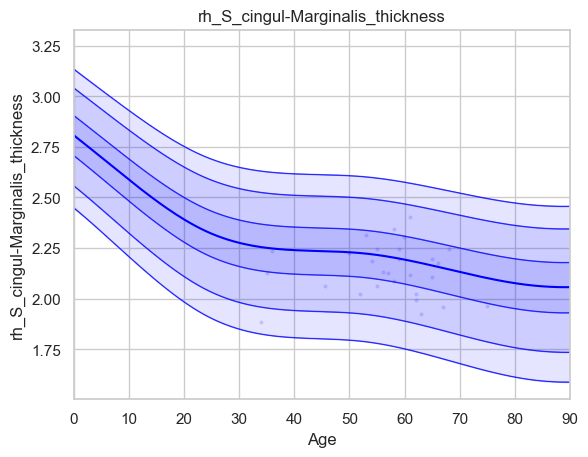

Running IDP 121 rh_S_circular_insula_ant_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.22750587]), 'Rho': array([0.15590106]), 'pRho': array([0.38148838]), 'SMSE': array([0.99096556]), 'EXPV': array([0.02144914])}


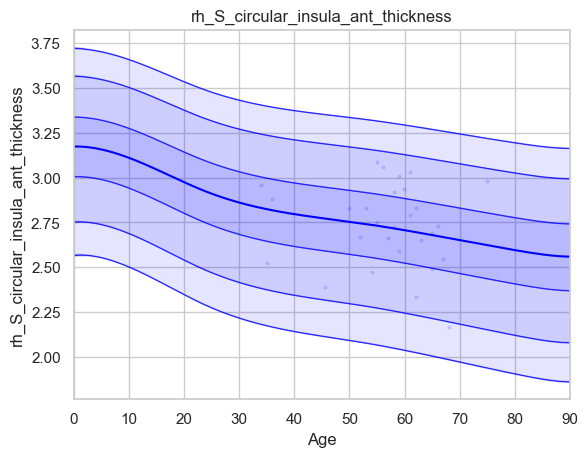

Running IDP 122 rh_S_circular_insula_inf_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.19788134]), 'Rho': array([0.41465294]), 'pRho': array([0.01402611]), 'SMSE': array([0.84499216]), 'EXPV': array([0.16732233])}


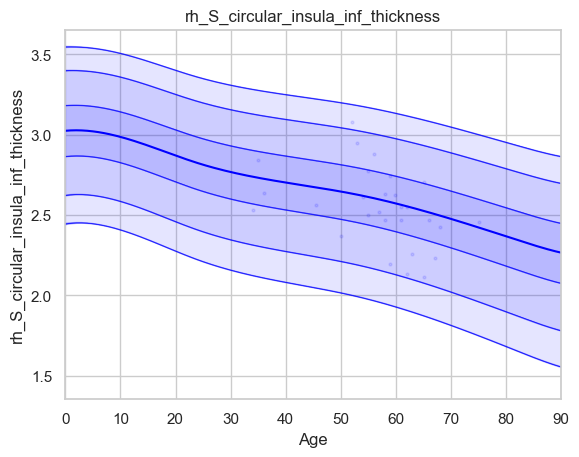

Running IDP 123 rh_S_circular_insula_sup_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.14701113]), 'Rho': array([0.27989505]), 'pRho': array([0.10935212]), 'SMSE': array([1.00182782]), 'EXPV': array([0.07832747])}


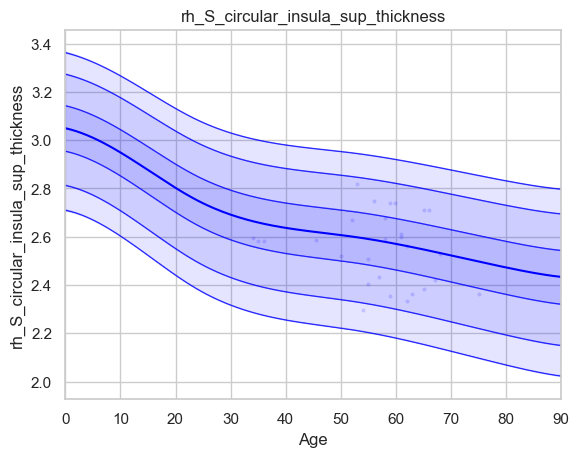

Running IDP 124 rh_S_collat_transv_ant_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.17014442]), 'Rho': array([0.30699527]), 'pRho': array([0.07735693]), 'SMSE': array([0.9433962]), 'EXPV': array([0.06454653])}


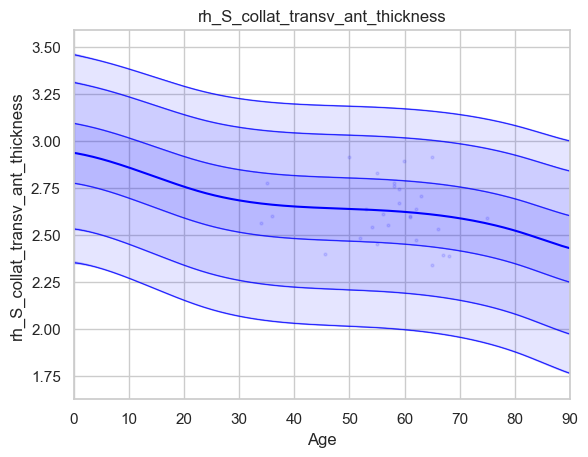

Running IDP 125 rh_S_collat_transv_post_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.22211402]), 'Rho': array([0.19825453]), 'pRho': array([0.26329058]), 'SMSE': array([0.96808473]), 'EXPV': array([0.03408035])}


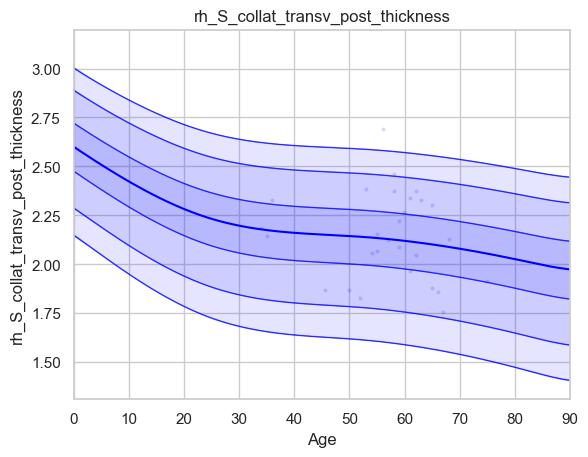

Running IDP 126 rh_S_front_inf_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.13038176]), 'Rho': array([0.16352874]), 'pRho': array([0.3582325]), 'SMSE': array([1.25084229]), 'EXPV': array([0.0117879])}


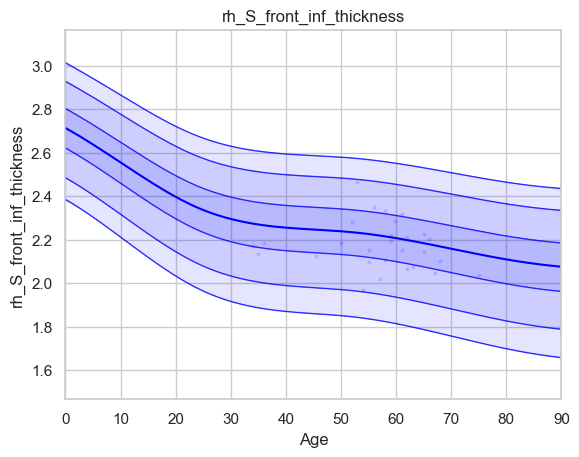

Running IDP 127 rh_S_front_middle_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.12892987]), 'Rho': array([0.1755895]), 'pRho': array([0.32321218]), 'SMSE': array([1.19001842]), 'EXPV': array([0.02610789])}


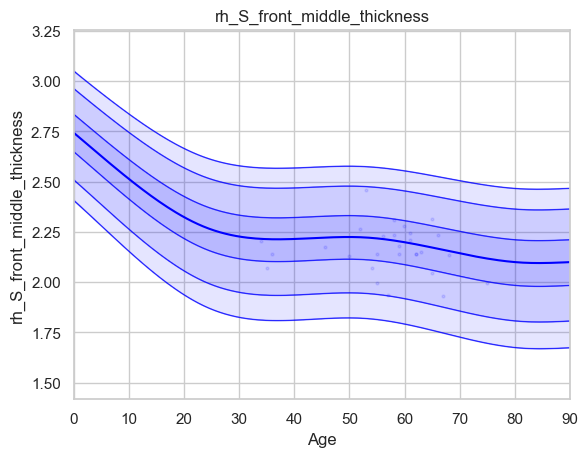

Running IDP 128 rh_S_front_sup_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.12920287]), 'Rho': array([0.38586302]), 'pRho': array([0.02347029]), 'SMSE': array([1.14788695]), 'EXPV': array([0.14426267])}


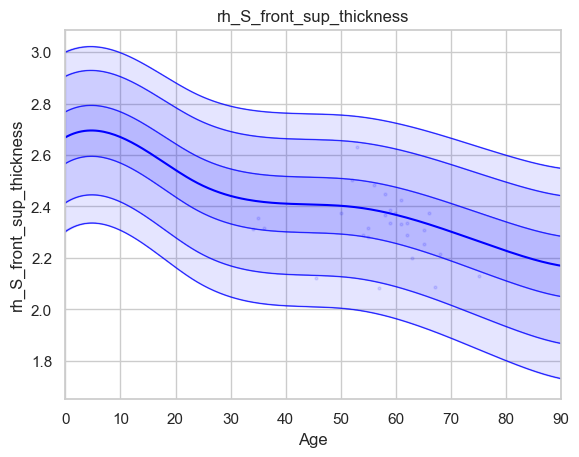

Running IDP 129 rh_S_interm_prim-Jensen_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.13515606]), 'Rho': array([0.1175712]), 'pRho': array([0.51076293]), 'SMSE': array([1.31344089]), 'EXPV': array([-0.07588522])}


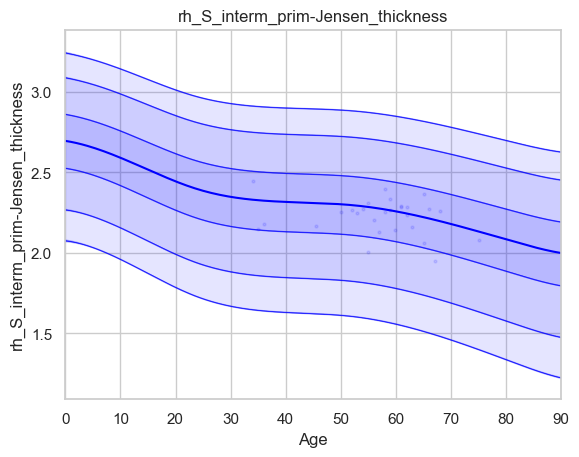

Running IDP 130 rh_S_intrapariet&P_trans_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.24244151]), 'Rho': array([0.]), 'pRho': array([1.]), 'SMSE': array([0.]), 'EXPV': array([0.])}


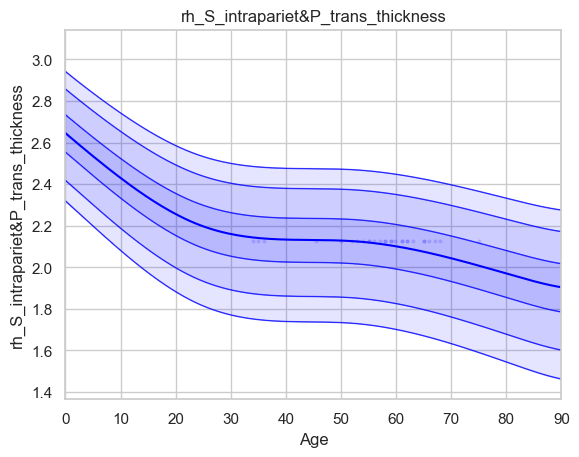

Running IDP 131 rh_S_oc_middle&Lunatus_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.16852263]), 'Rho': array([0.]), 'pRho': array([1.]), 'SMSE': array([0.]), 'EXPV': array([0.])}


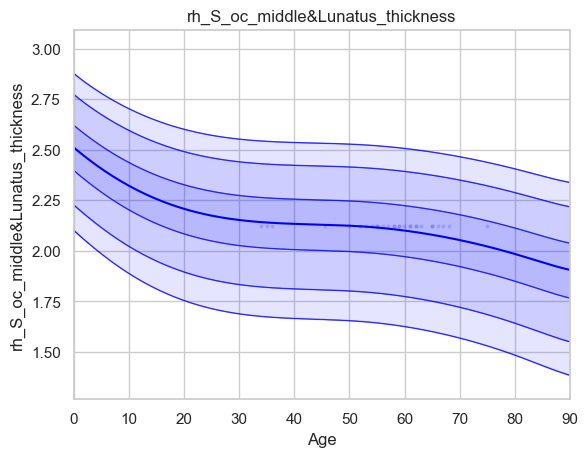

Running IDP 132 rh_S_oc_sup&transversal_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.17386053]), 'Rho': array([0.]), 'pRho': array([1.]), 'SMSE': array([0.]), 'EXPV': array([0.])}


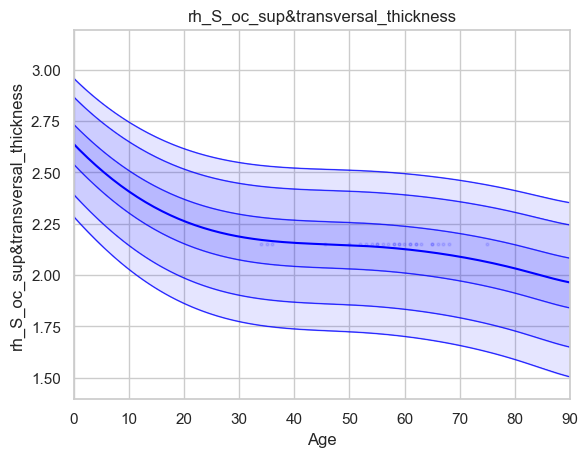

Running IDP 133 rh_S_occipital_ant_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.19017265]), 'Rho': array([0.30772786]), 'pRho': array([0.07660454]), 'SMSE': array([1.03609156]), 'EXPV': array([0.08487378])}


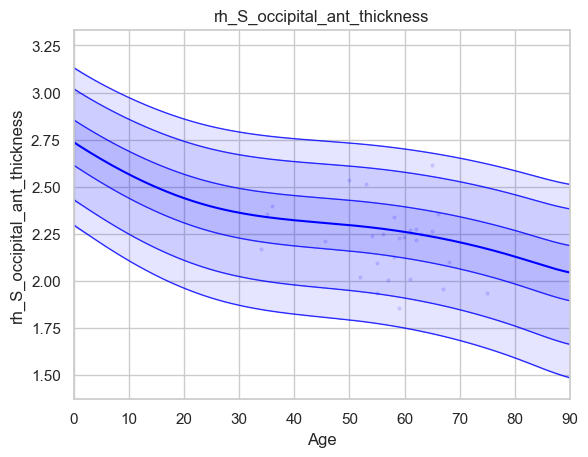

Running IDP 134 rh_S_oc-temp_lat_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.18292826]), 'Rho': array([0.21429098]), 'pRho': array([0.22554877]), 'SMSE': array([0.97364913]), 'EXPV': array([0.02775696])}


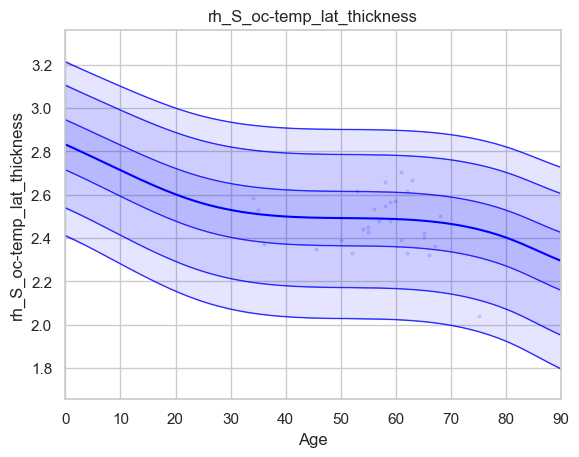

Running IDP 135 rh_S_oc-temp_med&Lingual_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.30444291]), 'Rho': array([0.]), 'pRho': array([1.]), 'SMSE': array([0.]), 'EXPV': array([0.])}


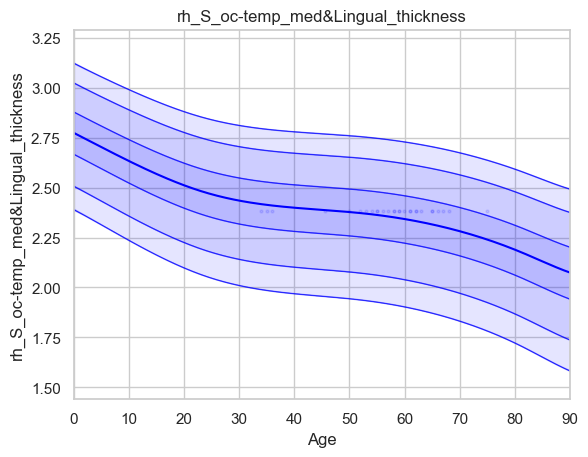

Running IDP 136 rh_S_orbital_lateral_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.19175176]), 'Rho': array([0.03428935]), 'pRho': array([0.8485335]), 'SMSE': array([1.11480793]), 'EXPV': array([-0.01026242])}


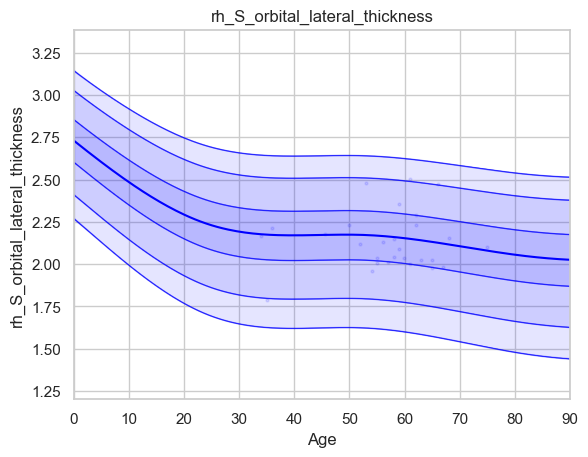

Running IDP 137 rh_S_orbital_med-olfact_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.14428257]), 'Rho': array([0.16460224]), 'pRho': array([0.35502804]), 'SMSE': array([0.97370128]), 'EXPV': array([0.02691898])}


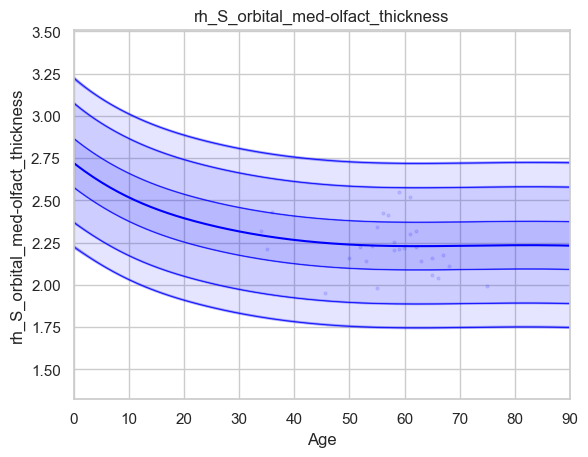

Running IDP 138 rh_S_orbital-H_Shaped_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.16192565]), 'Rho': array([0.12578234]), 'pRho': array([0.48139837]), 'SMSE': array([1.05415585]), 'EXPV': array([0.01140285])}


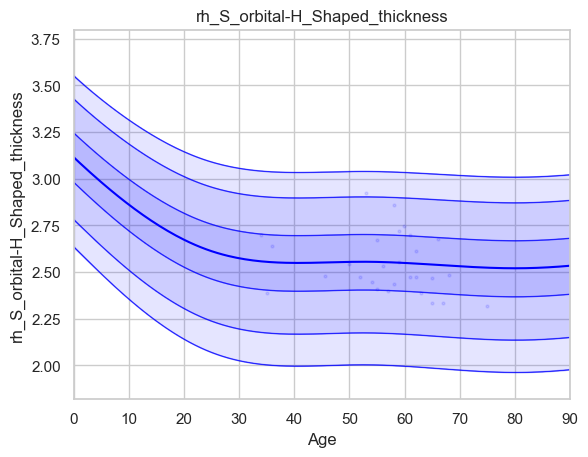

Running IDP 139 rh_S_parieto_occipital_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.1595507]), 'Rho': array([0.28603166]), 'pRho': array([0.10136889]), 'SMSE': array([0.92024514]), 'EXPV': array([0.07987042])}


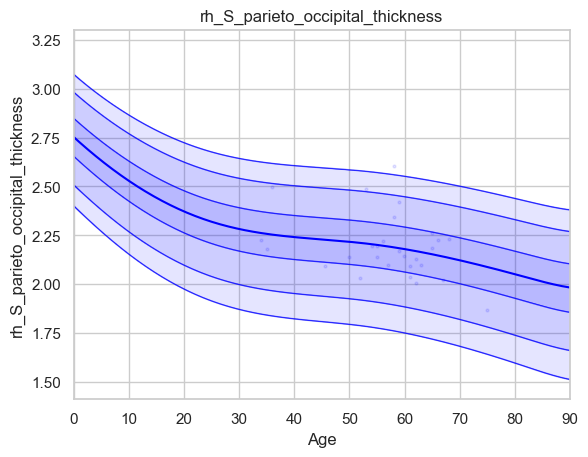

Running IDP 140 rh_S_pericallosal_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.17839498]), 'Rho': array([0.01529194]), 'pRho': array([0.93214331]), 'SMSE': array([1.051265]), 'EXPV': array([-0.02448461])}


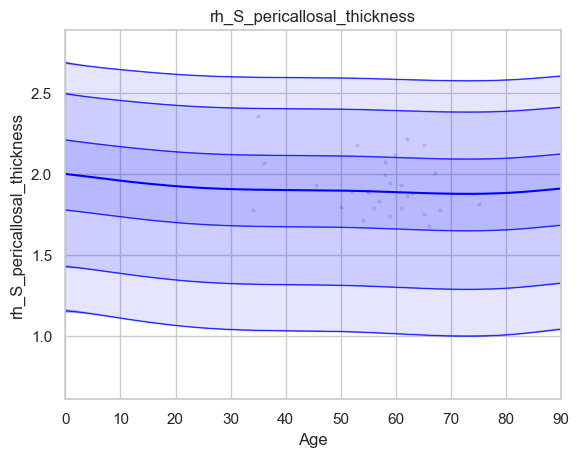

Running IDP 141 rh_S_postcentral_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.08364742]), 'Rho': array([0.49260477]), 'pRho': array([0.00266653]), 'SMSE': array([0.77277276]), 'EXPV': array([0.23734671])}


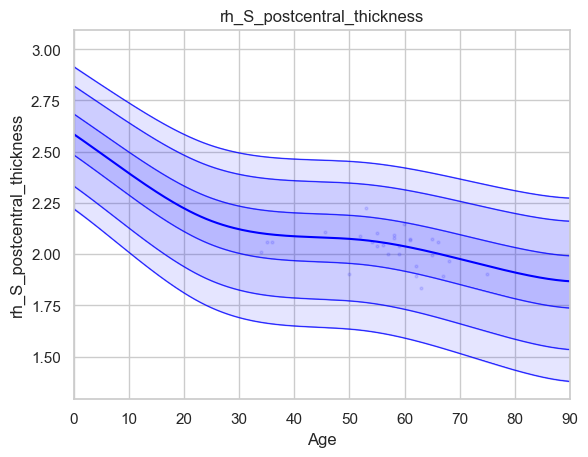

Running IDP 142 rh_S_precentral-inf-part_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.12464194]), 'Rho': array([0.26731947]), 'pRho': array([0.12715265]), 'SMSE': array([0.9318566]), 'EXPV': array([0.06871312])}


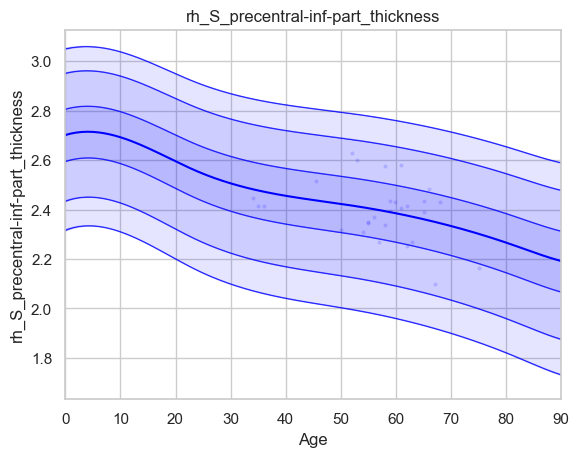

Running IDP 143 rh_S_precentral-sup-part_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.12210175]), 'Rho': array([0.40209355]), 'pRho': array([0.01766013]), 'SMSE': array([0.92013237]), 'EXPV': array([0.1616159])}


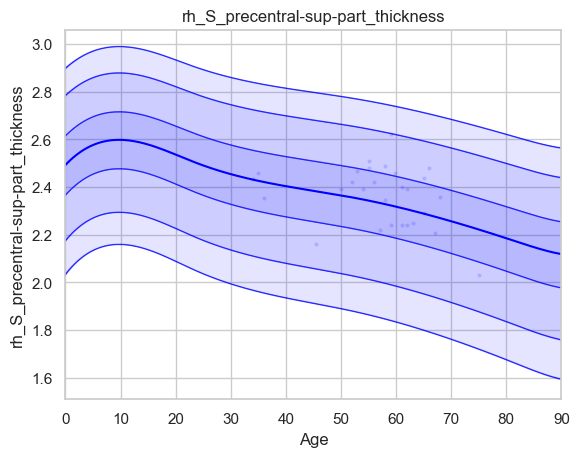

Running IDP 144 rh_S_suborbital_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.30499335]), 'Rho': array([0.08184565]), 'pRho': array([0.6478731]), 'SMSE': array([0.99716348]), 'EXPV': array([0.00423474])}


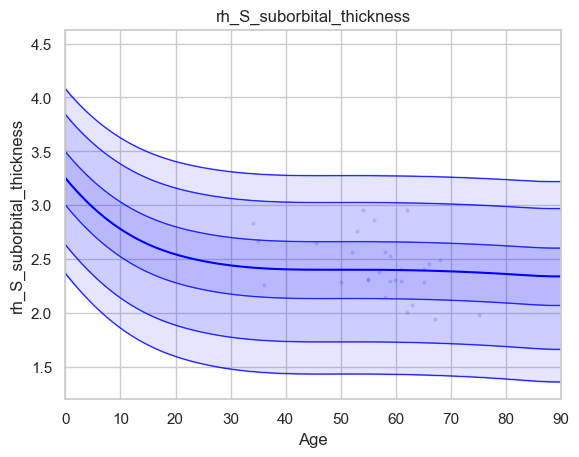

Running IDP 145 rh_S_subparietal_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.14213532]), 'Rho': array([0.3909845]), 'pRho': array([0.02148943]), 'SMSE': array([0.90532475]), 'EXPV': array([0.12398109])}


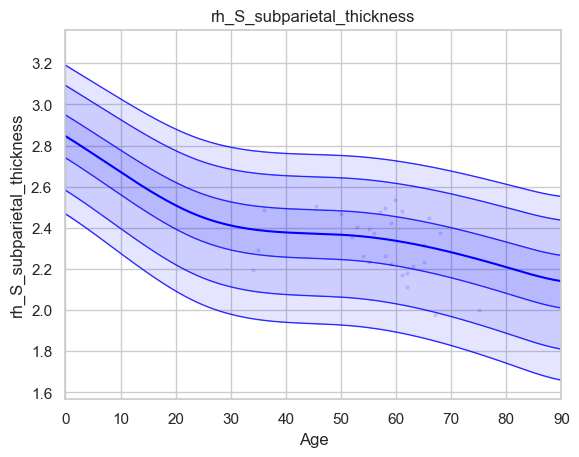

Running IDP 146 rh_S_temporal_inf_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.13466925]), 'Rho': array([0.29449537]), 'pRho': array([0.09108284]), 'SMSE': array([0.9463825]), 'EXPV': array([0.06174724])}


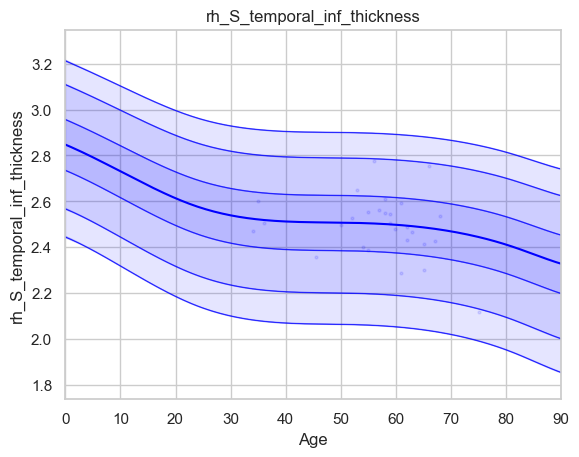

Running IDP 147 rh_S_temporal_sup_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.10691777]), 'Rho': array([0.30388663]), 'pRho': array([0.08061255]), 'SMSE': array([0.97221371]), 'EXPV': array([0.08800401])}


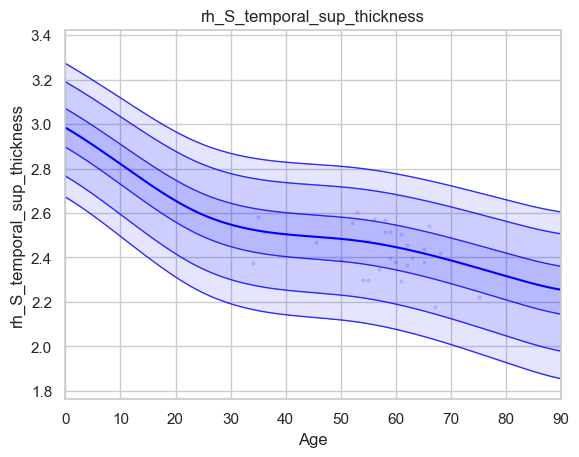

Running IDP 148 rh_S_temporal_transverse_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.31662097]), 'Rho': array([0.41798874]), 'pRho': array([0.01317288]), 'SMSE': array([1.07369925]), 'EXPV': array([0.1401581])}


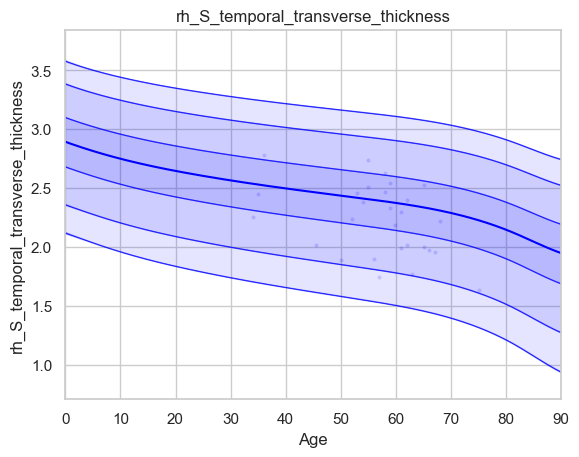

Running IDP 149 rh_MeanThickness_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.07788765]), 'Rho': array([0.44360477]), 'pRho': array([0.00794948]), 'SMSE': array([0.86038838]), 'EXPV': array([0.19669684])}


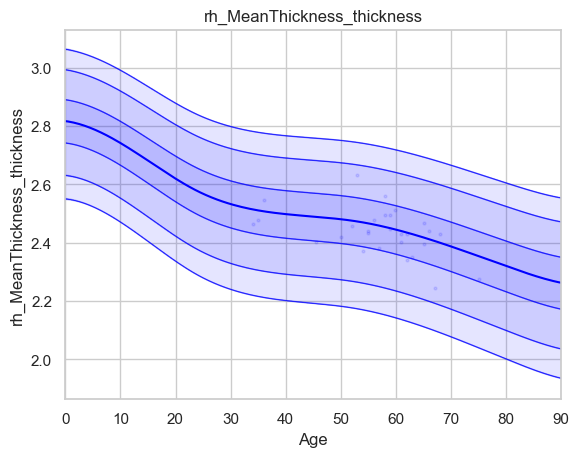

In [14]:
sns.set(style='whitegrid')

for idp_num, idp in enumerate(idp_ids): 
    print('Running IDP', idp_num, idp, ':')
    idp_dir = os.path.join(out_dir, idp)
    os.chdir(idp_dir)
    
    # load the true data points
    yhat_te = load_2d(os.path.join(idp_dir, 'yhat_predict.txt'))
    s2_te = load_2d(os.path.join(idp_dir, 'ys2_predict.txt'))
    y_te = load_2d(os.path.join(idp_dir, 'resp_te.txt'))

    # set up the covariates for the dummy data
    print('Making predictions with dummy covariates (for visualisation)')
    yhat, s2 = predict(cov_file_dummy, 
                       alg = 'blr', 
                       respfile = None, 
                       model_path = os.path.join(idp_dir,'Models'), 
                       outputsuffix = '_dummy')
    
    # load the normative model
    with open(os.path.join(idp_dir,'Models', 'NM_0_0_estimate.pkl'), 'rb') as handle:
        nm = pickle.load(handle) 
    
    # get the warp and warp parameters
    W = nm.blr.warp
    warp_param = nm.blr.hyp[1:nm.blr.warp.get_n_params()+1] 
        
    # first, we warp predictions for the true data and compute evaluation metrics
    med_te = W.warp_predictions(np.squeeze(yhat_te), np.squeeze(s2_te), warp_param)[0]
    med_te = med_te[:, np.newaxis]
    print('metrics:', evaluate(y_te, med_te))

    # then, we warp dummy predictions to create the plots
    med, pr_int = W.warp_predictions(np.squeeze(yhat), np.squeeze(s2), warp_param)
    
    # extract the different variance components to visualise
    beta, junk1, junk2 = nm.blr._parse_hyps(nm.blr.hyp, X_dummy)
    s2n = 1/beta # variation (aleatoric uncertainty)
    s2s = s2-s2n # modelling uncertainty (epistemic uncertainty)
    
    # plot the data points
    y_te_rescaled_all = np.zeros_like(y_te)
    for sid, site in enumerate(site_ids_te):
        # plot the true test data points
        if all(elem in site_ids_tr for elem in site_ids_te):
            # all data in the test set are present in the training set
            
            # first, we select the data points belonging to this particular site
            idx = np.where(np.bitwise_and(X_te[:,2] == sex, X_te[:,sid+len(cols_cov)+1] !=0))[0]
            if len(idx) == 0:
                print('No data for site', sid, site, 'skipping...')
                continue
            
            # then directly adjust the data
            idx_dummy = np.bitwise_and(X_dummy[:,1] > X_te[idx,1].min(), X_dummy[:,1] < X_te[idx,1].max())
            y_te_rescaled = y_te[idx] - np.median(y_te[idx]) + np.median(med[idx_dummy])
        else:
            # we need to adjust the data based on the adaptation dataset 
            
            # first, select the data point belonging to this particular site
            idx = np.where(np.bitwise_and(X_te[:,2] == sex, (df_te['site'] == site).to_numpy()))[0]
            
            # load the adaptation data
            y_ad = load_2d(os.path.join(idp_dir, 'resp_ad.txt'))
            X_ad = load_2d(os.path.join(idp_dir, 'cov_bspline_ad.txt'))
            idx_a = np.where(np.bitwise_and(X_ad[:,2] == sex, (df_ad['site'] == site).to_numpy()))[0]
            if len(idx) < 2 or len(idx_a) < 2:
                print('Insufficent data for site', sid, site, 'skipping...')
                continue
            
            # adjust and rescale the data
            y_te_rescaled, s2_rescaled = nm.blr.predict_and_adjust(nm.blr.hyp, 
                                                                   X_ad[idx_a,:], 
                                                                   np.squeeze(y_ad[idx_a]), 
                                                                   Xs=None, 
                                                                   ys=np.squeeze(y_te[idx]))
        # plot the (adjusted) data points
        plt.scatter(X_te[idx,1], y_te_rescaled, s=4, color=clr, alpha = 0.1)
       
    # plot the median of the dummy data
    plt.plot(xx, med, clr)
    
    # fill the gaps in between the centiles
    junk, pr_int25 = W.warp_predictions(np.squeeze(yhat), np.squeeze(s2), warp_param, percentiles=[0.25,0.75])
    junk, pr_int95 = W.warp_predictions(np.squeeze(yhat), np.squeeze(s2), warp_param, percentiles=[0.05,0.95])
    junk, pr_int99 = W.warp_predictions(np.squeeze(yhat), np.squeeze(s2), warp_param, percentiles=[0.01,0.99])
    plt.fill_between(xx, pr_int25[:,0], pr_int25[:,1], alpha = 0.1,color=clr)
    plt.fill_between(xx, pr_int95[:,0], pr_int95[:,1], alpha = 0.1,color=clr)
    plt.fill_between(xx, pr_int99[:,0], pr_int99[:,1], alpha = 0.1,color=clr)
            
    # make the width of each centile proportional to the epistemic uncertainty
    junk, pr_int25l = W.warp_predictions(np.squeeze(yhat), np.squeeze(s2-0.5*s2s), warp_param, percentiles=[0.25,0.75])
    junk, pr_int95l = W.warp_predictions(np.squeeze(yhat), np.squeeze(s2-0.5*s2s), warp_param, percentiles=[0.05,0.95])
    junk, pr_int99l = W.warp_predictions(np.squeeze(yhat), np.squeeze(s2-0.5*s2s), warp_param, percentiles=[0.01,0.99])
    junk, pr_int25u = W.warp_predictions(np.squeeze(yhat), np.squeeze(s2+0.5*s2s), warp_param, percentiles=[0.25,0.75])
    junk, pr_int95u = W.warp_predictions(np.squeeze(yhat), np.squeeze(s2+0.5*s2s), warp_param, percentiles=[0.05,0.95])
    junk, pr_int99u = W.warp_predictions(np.squeeze(yhat), np.squeeze(s2+0.5*s2s), warp_param, percentiles=[0.01,0.99])    
    plt.fill_between(xx, pr_int25l[:,0], pr_int25u[:,0], alpha = 0.3,color=clr)
    plt.fill_between(xx, pr_int95l[:,0], pr_int95u[:,0], alpha = 0.3,color=clr)
    plt.fill_between(xx, pr_int99l[:,0], pr_int99u[:,0], alpha = 0.3,color=clr)
    plt.fill_between(xx, pr_int25l[:,1], pr_int25u[:,1], alpha = 0.3,color=clr)
    plt.fill_between(xx, pr_int95l[:,1], pr_int95u[:,1], alpha = 0.3,color=clr)
    plt.fill_between(xx, pr_int99l[:,1], pr_int99u[:,1], alpha = 0.3,color=clr)

    # plot actual centile lines
    plt.plot(xx, pr_int25[:,0],color=clr, linewidth=0.5)
    plt.plot(xx, pr_int25[:,1],color=clr, linewidth=0.5)
    plt.plot(xx, pr_int95[:,0],color=clr, linewidth=0.5)
    plt.plot(xx, pr_int95[:,1],color=clr, linewidth=0.5)
    plt.plot(xx, pr_int99[:,0],color=clr, linewidth=0.5)
    plt.plot(xx, pr_int99[:,1],color=clr, linewidth=0.5)
    
    plt.xlabel('Age')
    plt.ylabel(idp) 
    plt.title(idp)
    plt.xlim((0,90))
    plt.savefig(os.path.join(idp_dir, 'centiles_' + str(sex)),  bbox_inches='tight')
    plt.show()

os.chdir(out_dir)

In [60]:
# explore an example output folder of a single model (one ROI)
# think about what each of these output files represents. 
# Hint: look at the variable names and comments in the code block above
! ls rh_MeanThickness_thickness/

EXPV_predict.txt
Models
RMSE_predict.txt
Rho_predict.txt
SMSE_predict.txt
Z_predict.txt
centiles_0.png
centiles_1.png
corrected_values_by_subject.csv
cov_bspline_ad.txt
cov_bspline_te.txt
lh_G&S_subcentral_thickness_normative_plot_corrected.png
pRho_predict.txt
predicted_values.csv
resp_ad.txt
resp_te.txt
sitenum_ad.txt
sitenum_te.txt
yhat_dummy.pkl
yhat_predict.txt
ys2_dummy.pkl
ys2_predict.txt


In [15]:
# check that the number of deviation scores matches the number of subjects in the test set
# there should be one deviation score per subject (one line per subject), so we can
# verify by counting the line numbers in the Z_predict.txt file
! cat rh_MeanThickness_thickness/Z_predict.txt | wc

      34      34     871


The deviation scores are output as a text file in separate folders. We want to summarize the deviation scores across all models estimates so we can organize them into a single file, and merge the deviation scores into the original data file. 

In [16]:
! mkdir deviation_scores

mkdir: deviation_scores: File exists


In [17]:
! for i in *; do if [[ -e ${i}/Z_predict.txt ]]; then cp ${i}/Z_predict.txt deviation_scores/${i}_Z_predict.txt; fi; done

In [18]:
z_dir = '/Users/valentinahaas/Desktop/ETH/Masterarbeit/PythonProjects/braincharts/scripts/models/' + model_name + '/deviation_scores/'
filelist = [name for name in os.listdir(z_dir)]

In [19]:
print("Gefundene IDPs mit yhat_predict.txt:")
print(filelist)


Gefundene IDPs mit yhat_predict.txt:
['lh_S_temporal_inf_thickness_Z_predict.txt', 'rh_G&S_cingul-Mid-Post_thickness_Z_predict.txt', 'lh_G&S_cingul-Ant_thickness_Z_predict.txt', 'lh_G_insular_short_thickness_Z_predict.txt', 'Left-vessel_Z_predict.txt', 'rh_S_orbital-H_Shaped_thickness_Z_predict.txt', '4th-Ventricle_Z_predict.txt', 'lh_G_pariet_inf-Supramar_thickness_Z_predict.txt', 'EstimatedTotalIntraCranialVol_Z_predict.txt', 'rh_G&S_frontomargin_thickness_Z_predict.txt', 'lh_G_precentral_thickness_Z_predict.txt', 'lh_G&S_subcentral_thickness_Z_predict.txt', 'lh_S_cingul-Marginalis_thickness_Z_predict.txt', 'lh_G_Ins_lg&S_cent_ins_thickness_Z_predict.txt', 'rh_S_pericallosal_thickness_Z_predict.txt', 'rh_S_precentral-inf-part_thickness_Z_predict.txt', 'Left-Cerebellum-Cortex_Z_predict.txt', 'lh_G_front_inf-Orbital_thickness_Z_predict.txt', 'rh_G_precentral_thickness_Z_predict.txt', 'Right-choroid-plexus_Z_predict.txt', 'rh_G_oc-temp_med-Lingual_thickness_Z_predict.txt', 'lh_S_intrapa

In [20]:
# Update with your actual model output folder
model_path = '/Users/valentinahaas/Desktop/ETH/Masterarbeit/PythonProjects/braincharts/scripts/models/lifespan_57K_82sites/'
subjects = df_te['subjects'].tolist()  # From your test data

# Get list of IDP folders
idp_dirs = [d for d in os.listdir(model_path) if os.path.isdir(os.path.join(model_path, d)) and os.path.exists(os.path.join(model_path, d, 'yhat_predict.txt'))]


adjusted_preds = []

for idp in idp_dirs:
    idp_dir = os.path.join(model_path, idp)

    # Load required data for the current IDP
    y_te = load_2d(os.path.join(idp_dir, 'resp_te.txt')).squeeze()
    y_ad = load_2d(os.path.join(idp_dir, 'resp_ad.txt')).squeeze()
    X_te = load_2d(os.path.join(idp_dir, 'cov_bspline_te.txt'))
    X_ad = load_2d(os.path.join(idp_dir, 'cov_bspline_ad.txt'))
    model_file = os.path.join(idp_dir, 'Models', 'NM_0_0_estimate.pkl')

    # Load the normative model
    with open(model_file, 'rb') as f:
        nm = pickle.load(f)

    # Ensure y_test values come directly from df_te
    y_te = df_te[idp].to_numpy()

    for i in range(len(df_te)):
        subj_site = df_te.iloc[i]['site']
        subj_sex = df_te.iloc[i]['sex']
        y_te_subj = np.array([y_te[i]])  # Sicher als Array

        # Select matching control subjects from adaptation set (same site + sex)
        idx_ad = df_ad[(df_ad['site'] == subj_site) & (df_ad['sex'] == subj_sex)].index

        if len(idx_ad) < 2:
            print(f" Not enough adaptation data for subject {i} / site {subj_site} — skipping")
            continue

        X_ad_site = X_ad[idx_ad, :]
        y_ad_site = y_ad[idx_ad]

        X_te_subj = X_te[i:i+1, :]
        y_te_subj = y_te[i:i+1]

        # Apply prediction and site/sex correction
        pred_adj, _ = nm.blr.predict_and_adjust(
            nm.blr.hyp,
            X_ad_site,
            np.squeeze(y_ad_site),
            Xs=None,
            ys = y_te_subj.reshape(1,)

        )

        adjusted_preds.append({
            'subject': df_te.iloc[i]['subjects'],
            'IDP': idp,
            'predicted_corrected_plot_value': pred_adj
        })
# Create dataframe from predictions
df_corrected = pd.DataFrame(adjusted_preds)

# Create wide-format table
df_wide = df_corrected.pivot(index='subject', columns='IDP', values='predicted_corrected_plot_value').reset_index()

#Save
df_wide.to_csv('Adjusted_Values.csv', index=False)


 Wide-format saved as 'plot_matched_predicted_values_wide.csv'
